### 🧰 1. Importing Required Libraries

In [1]:
from pathlib import Path
import numpy as np
import os, shutil
import matplotlib.pyplot as plt

from PIL import Image

from tqdm.auto import tqdm

import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms
import torch.optim as optim

from torchvision.models import resnet50, ResNet50_Weights

C:\Users\shaur\anaconda3\envs\tf39gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### 🗂️ 2. Dataset Loader and Utilities

#### 🔧 Defining Transformations

#### 📁 Getting Categories from MVTec Dataset Directory

#### 🚚 Train/Test Loader Creation for All Categories

#### 📌 Example Usage: Loading All Categories and Printing Batch Info


In [2]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

from pathlib import Path
import os
import torch
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import ImageFolder
from torchvision.transforms import transforms

def get_categories(data_dir: str):
    """
    Return sorted list of category names based on subdirectories in MVTec base dir.
    """
    base = Path(data_dir)
    if not base.exists() or not base.is_dir():
        raise ValueError(f"Data directory {data_dir} does not exist or is not a directory.")
    cats = [p.name for p in base.iterdir() if p.is_dir() and not p.name.startswith('.')]
    return sorted(cats)

def get_train_test_loaders_all(data_dir: str,
                               transform=transform,
                               split_ratio: float = 0.8,
                               batch_size: int = 16,
                               shuffle: bool = True,
                               num_workers: int = 4,
                               seed: int = 42):
    """
    For every category in data_dir, create train/test DataLoaders by splitting 'good' images.
    Returns a dict: {category: (train_loader, test_loader)}.
    
    - data_dir: base MVTec path
    - split_ratio: fraction of good images for training
    - batch_size, shuffle, num_workers, seed: loader/split settings
    """
    categories = get_categories(data_dir)
    loaders = {}
    for cat in categories:
        train_path = os.path.join(data_dir, cat, 'train')
        if not os.path.isdir(train_path):
            raise ValueError(f"Train path missing for category '{cat}': {train_path}")
        dataset = ImageFolder(root=train_path, transform=transform)
        total = len(dataset)
        if total == 0:
            raise ValueError(f"No images found in {train_path}")
        train_size = int(total * split_ratio)
        test_size = total - train_size
        if shuffle:
            generator = torch.Generator().manual_seed(seed)
            train_ds, test_ds = random_split(dataset, [train_size, test_size], generator=generator)
        else:
            train_ds, test_ds = random_split(dataset, [train_size, test_size])
        train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=shuffle, num_workers=num_workers)
        test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=shuffle, num_workers=num_workers)
        loaders[cat] = (train_loader, test_loader)
    return loaders

DATA_DIR = r"C:\Users\shaur\OneDrive\Desktop\Deakin FTP\mvtec_anomaly_detection" #Replace with your own MVTec Dataset path
loaders_dict = get_train_test_loaders_all(DATA_DIR)
for cat, (train_loader, test_loader) in loaders_dict.items():
    print(f"Category: {cat}, #train batches: {len(train_loader)}, #test batches: {len(test_loader)}")

Category: bottle, #train batches: 11, #test batches: 3
Category: cable, #train batches: 12, #test batches: 3
Category: capsule, #train batches: 11, #test batches: 3
Category: carpet, #train batches: 14, #test batches: 4
Category: grid, #train batches: 14, #test batches: 4
Category: hazelnut, #train batches: 20, #test batches: 5
Category: leather, #train batches: 13, #test batches: 4
Category: metal_nut, #train batches: 11, #test batches: 3
Category: pill, #train batches: 14, #test batches: 4
Category: screw, #train batches: 16, #test batches: 4
Category: tile, #train batches: 12, #test batches: 3
Category: toothbrush, #train batches: 3, #test batches: 1
Category: transistor, #train batches: 11, #test batches: 3
Category: wood, #train batches: 13, #test batches: 4
Category: zipper, #train batches: 12, #test batches: 3


### 🧠 3. ResNet Feature Extractor

#### 🔧 Defining the `resnet_feature_extractor` Class

#### ⚙️ Initializing Pretrained ResNet and Freezing Parameters

#### 🪝 Hooking Layer2 and Layer3 for Feature Extraction

#### 🔄 Forward Pass: Extract, Resize, and Concatenate Feature Maps

In [3]:
class resnet_feature_extractor(torch.nn.Module):
    def __init__(self):
        """This class extracts the feature maps from a pretrained Resnet model."""
        super(resnet_feature_extractor, self).__init__()
        self.model = resnet50(weights=ResNet50_Weights.DEFAULT)

        self.model.eval()
        for param in self.model.parameters():
            param.requires_grad = False

        

        # Hook to extract feature maps
        def hook(module, input, output) -> None:
            """This hook saves the extracted feature map on self.featured."""
            self.features.append(output)

        self.model.layer2[-1].register_forward_hook(hook)            
        self.model.layer3[-1].register_forward_hook(hook) 

    def forward(self, input):

        self.features = []
        with torch.no_grad():
            _ = self.model(input)

        self.avg = torch.nn.AvgPool2d(3, stride=1)
        fmap_size = self.features[0].shape[-2]         # Feature map sizes h, w
        self.resize = torch.nn.AdaptiveAvgPool2d(fmap_size)

        resized_maps = [self.resize(self.avg(fmap)) for fmap in self.features]
        patch = torch.cat(resized_maps, 1)            # Merge the resized feature maps

        return patch

### 🖼️ 4. Visualizing Feature Map Shapes for Defective Samples

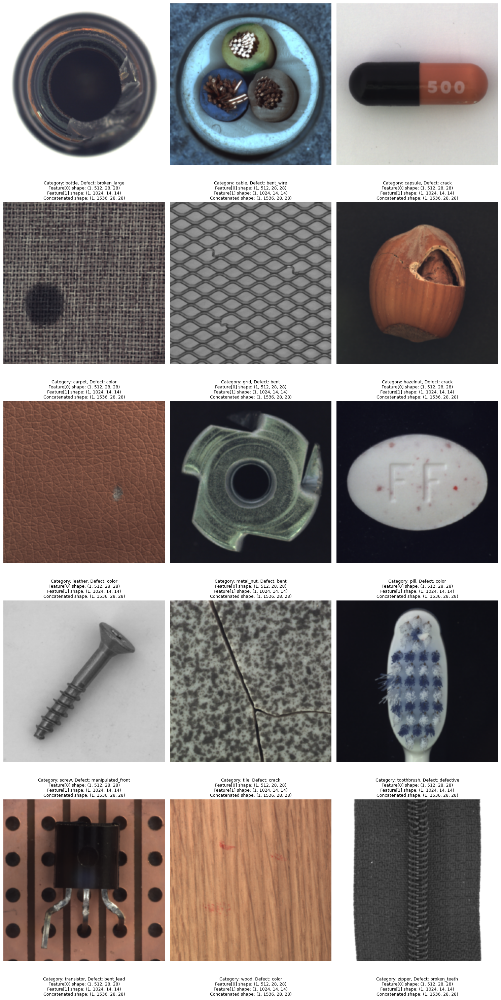

In [4]:
# Instantiate the model once
backbone = resnet_feature_extractor()

# Collect items with image tensor and info text
items = []
categories = [cat for cat in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, cat))]
for cat in categories:
    test_path = os.path.join(DATA_DIR, cat, 'test')
    if not os.path.exists(test_path):
        continue

    # find first defect-type folder (not 'good')
    defect_types = [d for d in os.listdir(test_path)
                    if d != 'good' and os.path.isdir(os.path.join(test_path, d))]
    if not defect_types:
        continue
    defect = defect_types[0]
    defect_dir = os.path.join(test_path, defect)
    img_files = sorted([f for f in os.listdir(defect_dir)
                        if f.lower().endswith(('png', 'jpg', 'jpeg'))])
    if not img_files:
        continue

    img_path = os.path.join(defect_dir, img_files[0])
    image = Image.open(img_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)

    # Forward pass
    feature = backbone(input_tensor)
    f0_shape = tuple(backbone.features[0].shape)
    f1_shape = tuple(backbone.features[1].shape)
    concat_shape = tuple(feature.shape)

    # Prepare the text exactly as printed
    info_text = (
        f"Category: {cat}, Defect: {defect}\n"
        f"Feature[0] shape: {f0_shape}\n"
        f"Feature[1] shape: {f1_shape}\n"
        f"Concatenated shape: {concat_shape}"
    )

    items.append({
        'img_tensor': input_tensor[0],
        'info_text': info_text
    })

# Plot grid: 3 per row, with info below each image
n = len(items)
if n == 0:
    print("No defect images found to display.")
else:
    cols = 3
    rows = (n + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
    axs = axs.flatten()

    for idx, item in enumerate(items):
        ax = axs[idx]
        # Show image
        ax.imshow(item['img_tensor'].permute(1, 2, 0))
        ax.axis('off')

        # Place info text below: use ax.text in axis coordinates
        # y coordinate < 0 draws below the image area; adjust as needed
        ax.text(
            0.5, -0.1, item['info_text'],
            transform=ax.transAxes,
            ha='center', va='top',
            fontsize=9
        )

    # Turn off unused axes
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

### 🧪 5. Feature Map Visualization


Category: bottle, Defect: broken_large
 Concatenated feature shape: (1, 1536, 28, 28)


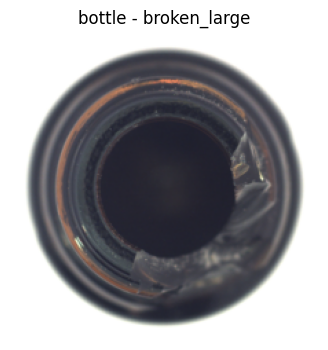

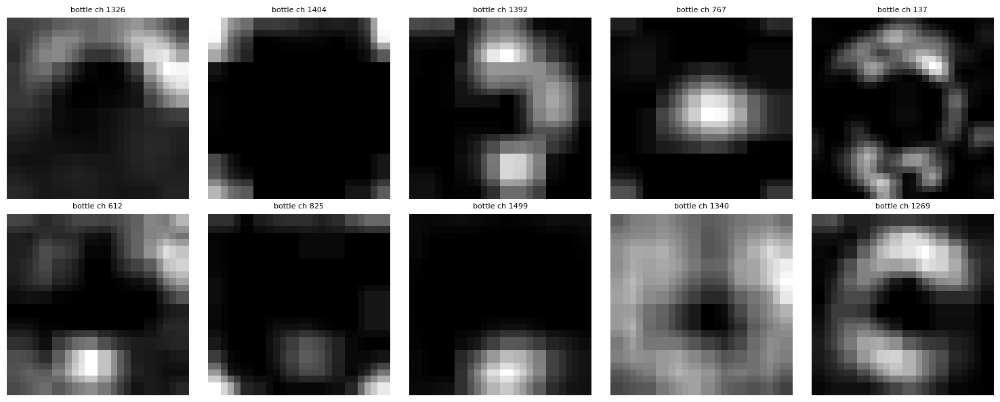


Category: cable, Defect: bent_wire
 Concatenated feature shape: (1, 1536, 28, 28)


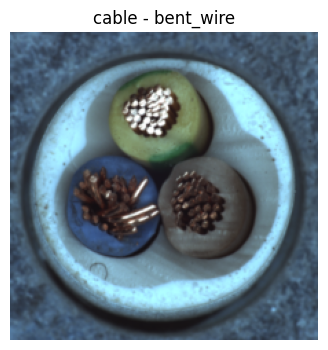

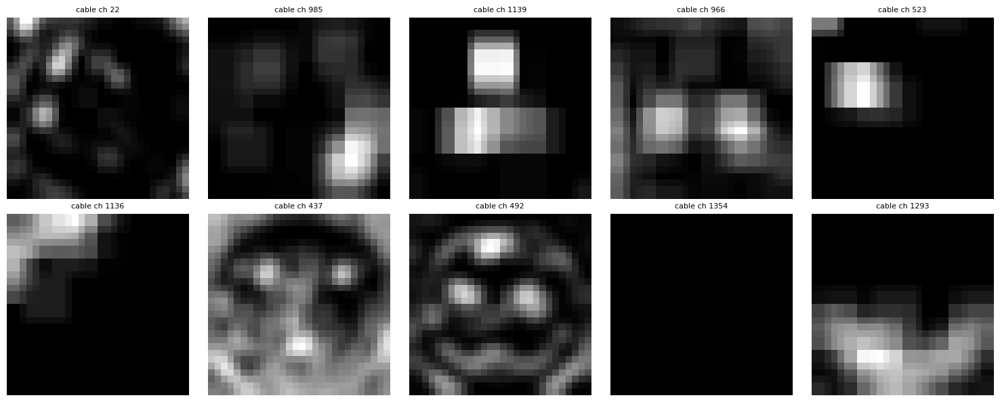


Category: capsule, Defect: crack
 Concatenated feature shape: (1, 1536, 28, 28)


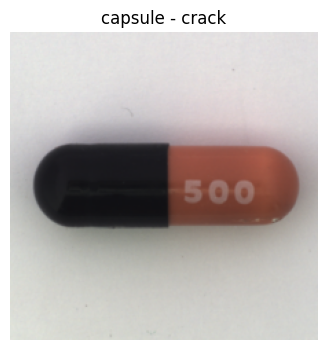

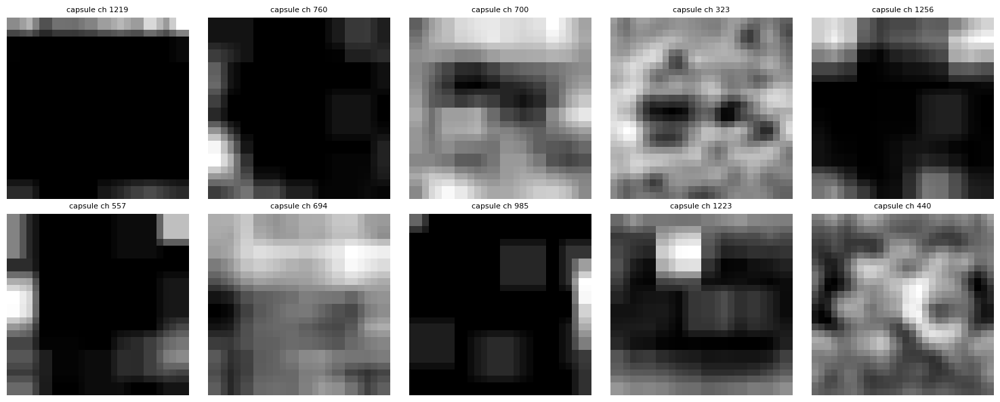


Category: carpet, Defect: color
 Concatenated feature shape: (1, 1536, 28, 28)


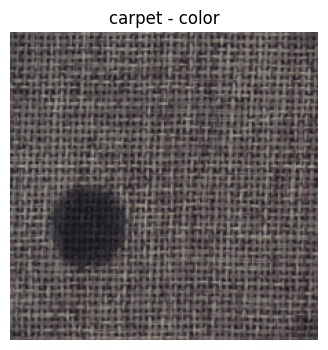

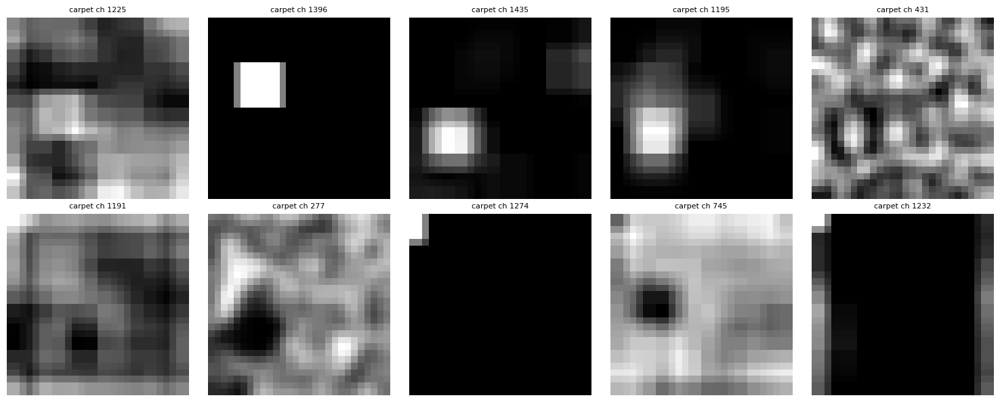


Category: grid, Defect: bent
 Concatenated feature shape: (1, 1536, 28, 28)


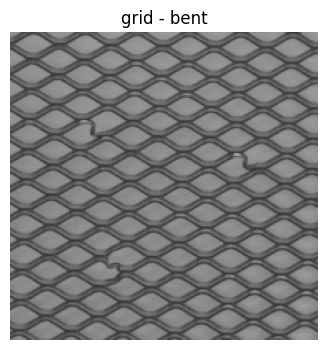

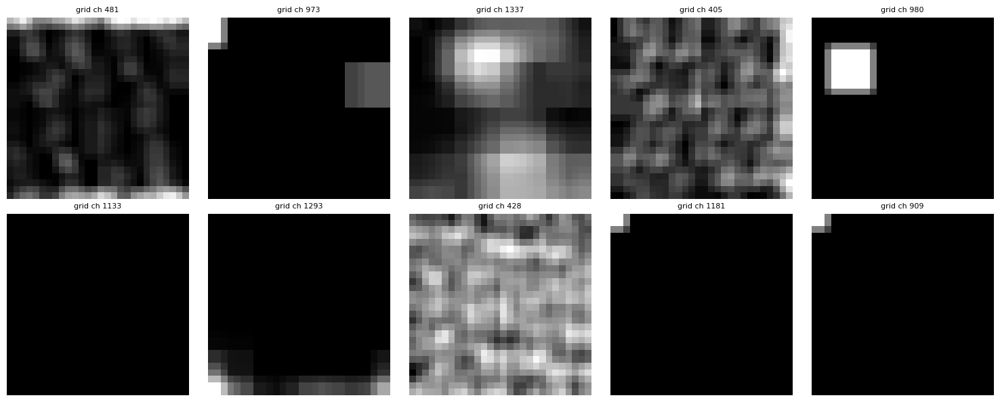


Category: hazelnut, Defect: crack
 Concatenated feature shape: (1, 1536, 28, 28)


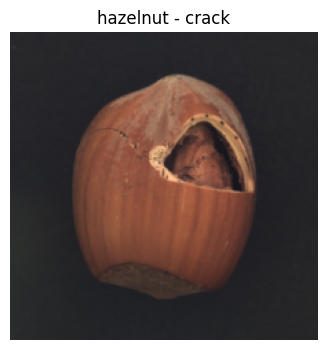

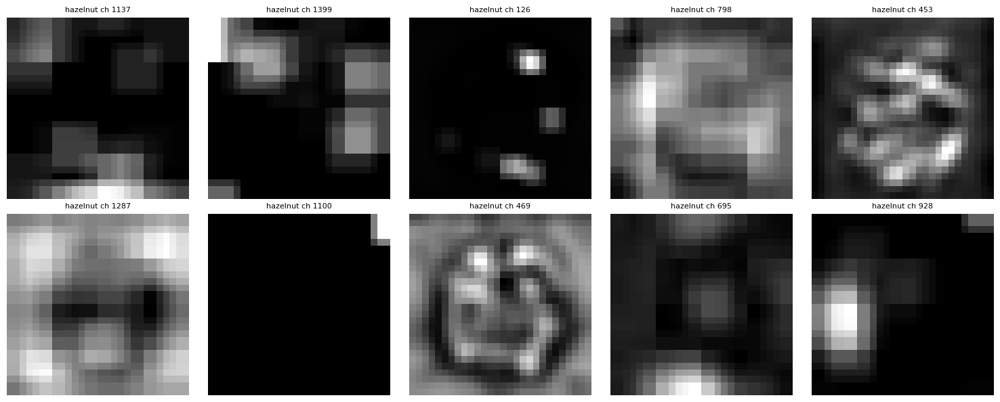


Category: leather, Defect: color
 Concatenated feature shape: (1, 1536, 28, 28)


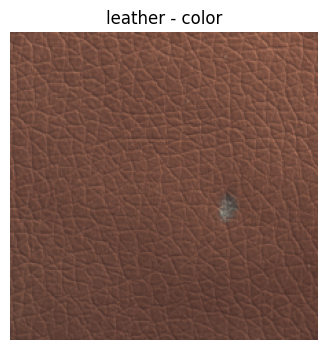

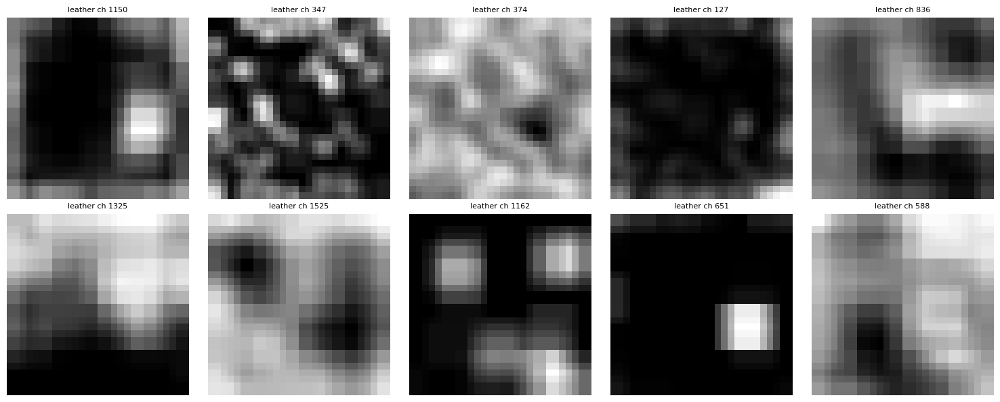


Category: metal_nut, Defect: bent
 Concatenated feature shape: (1, 1536, 28, 28)


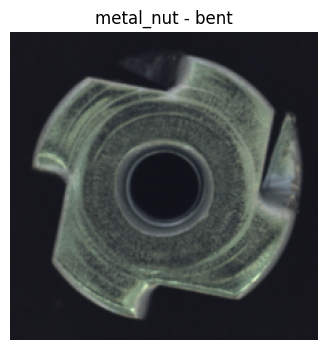

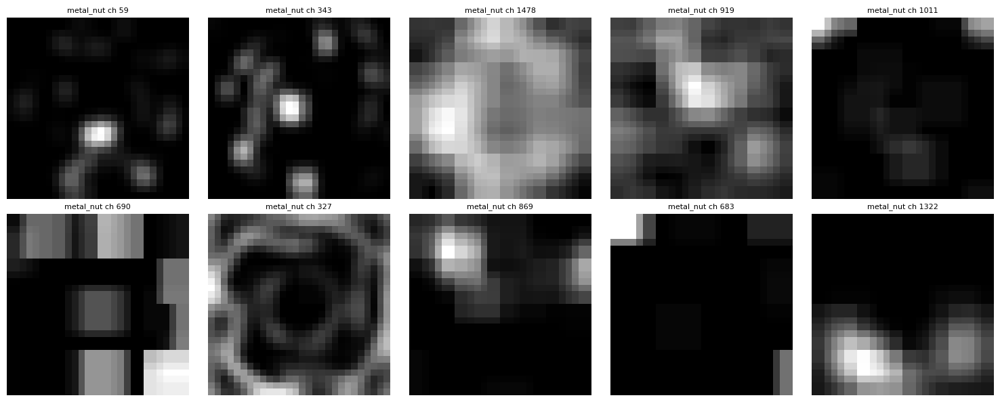


Category: pill, Defect: color
 Concatenated feature shape: (1, 1536, 28, 28)


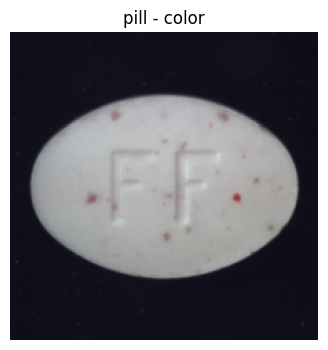

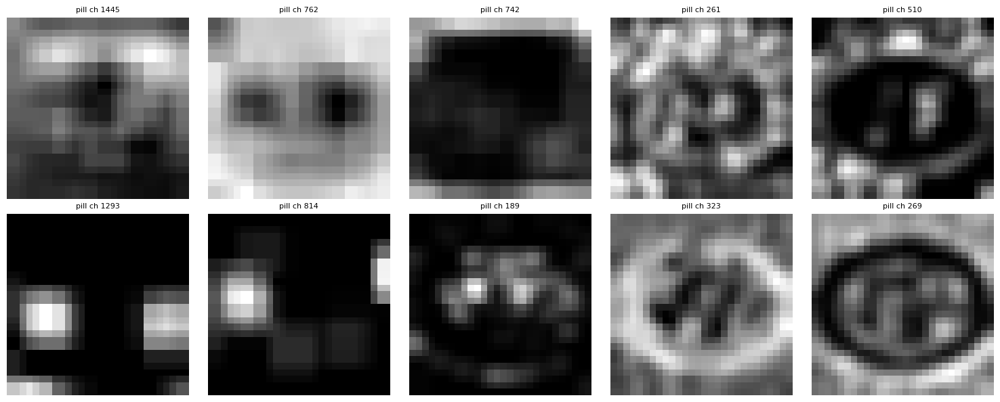


Category: screw, Defect: manipulated_front
 Concatenated feature shape: (1, 1536, 28, 28)


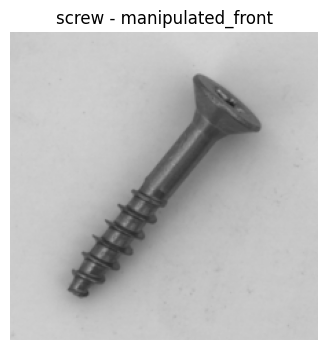

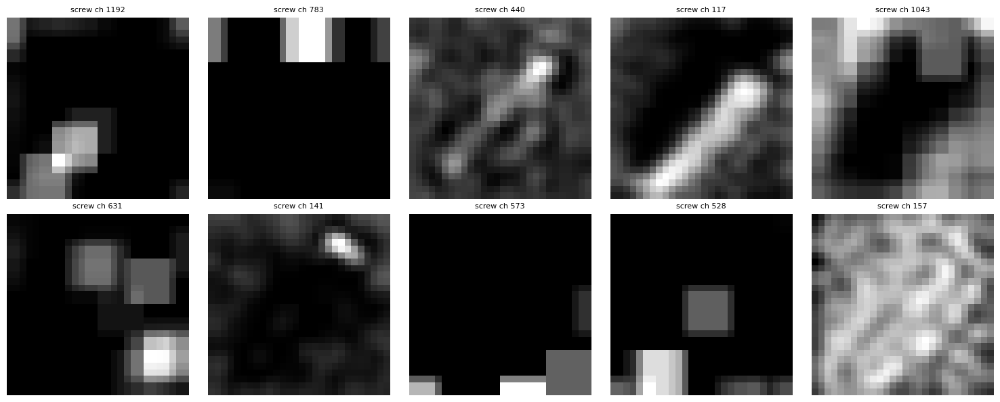


Category: tile, Defect: crack
 Concatenated feature shape: (1, 1536, 28, 28)


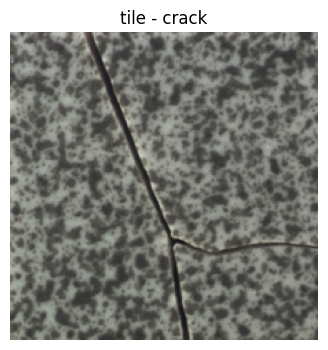

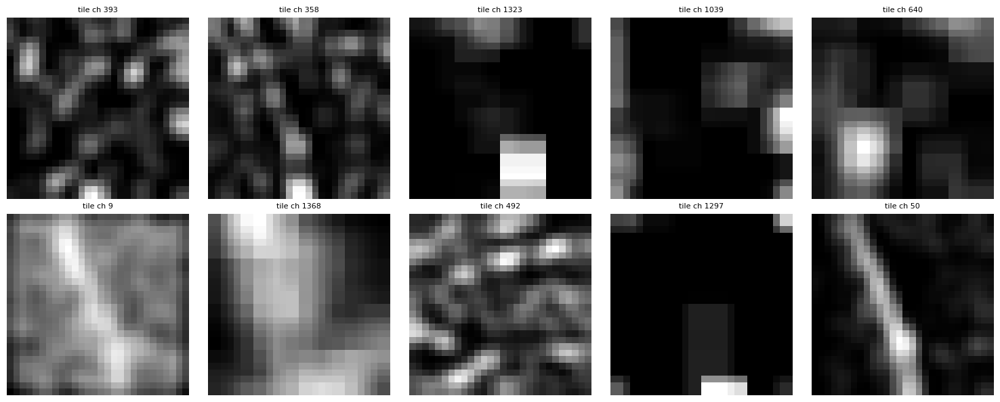


Category: toothbrush, Defect: defective
 Concatenated feature shape: (1, 1536, 28, 28)


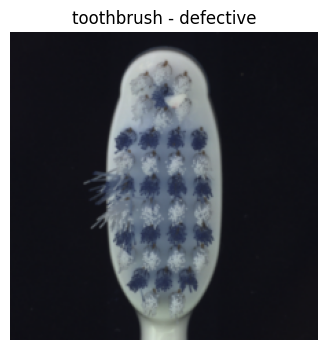

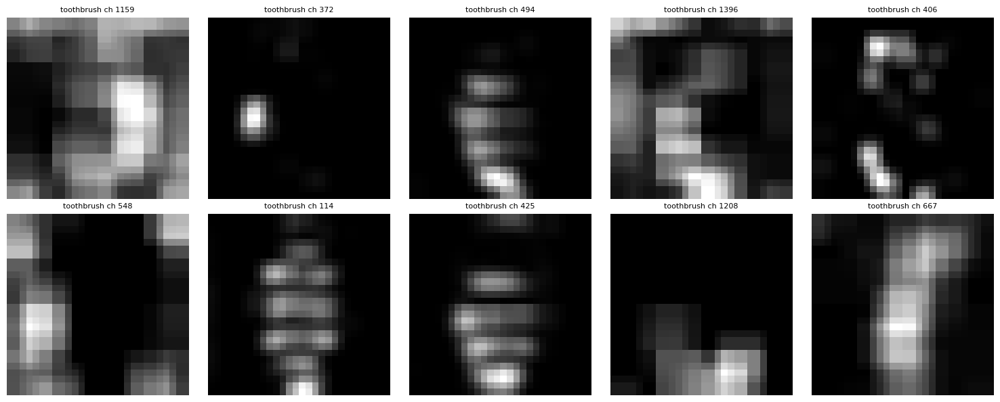


Category: transistor, Defect: bent_lead
 Concatenated feature shape: (1, 1536, 28, 28)


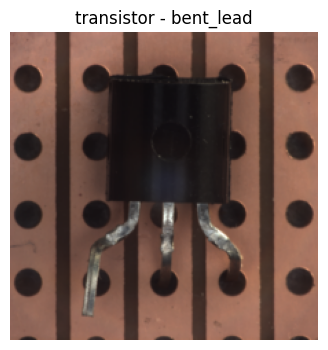

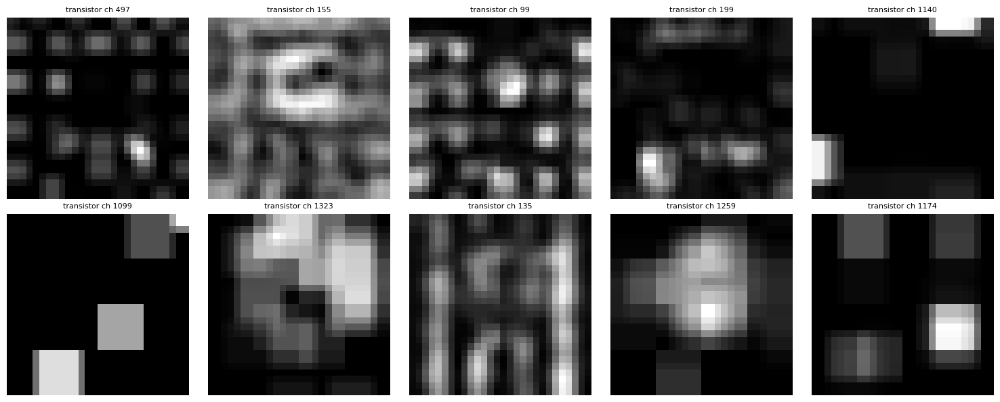


Category: wood, Defect: color
 Concatenated feature shape: (1, 1536, 28, 28)


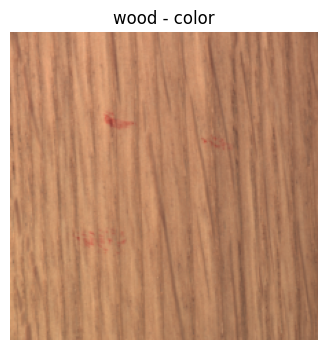

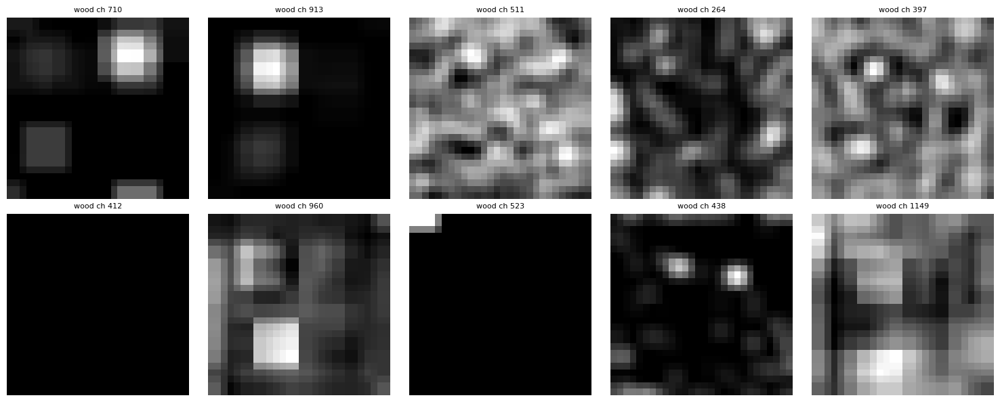


Category: zipper, Defect: broken_teeth
 Concatenated feature shape: (1, 1536, 28, 28)


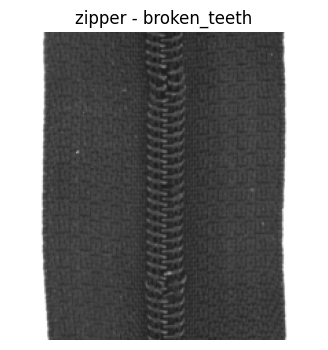

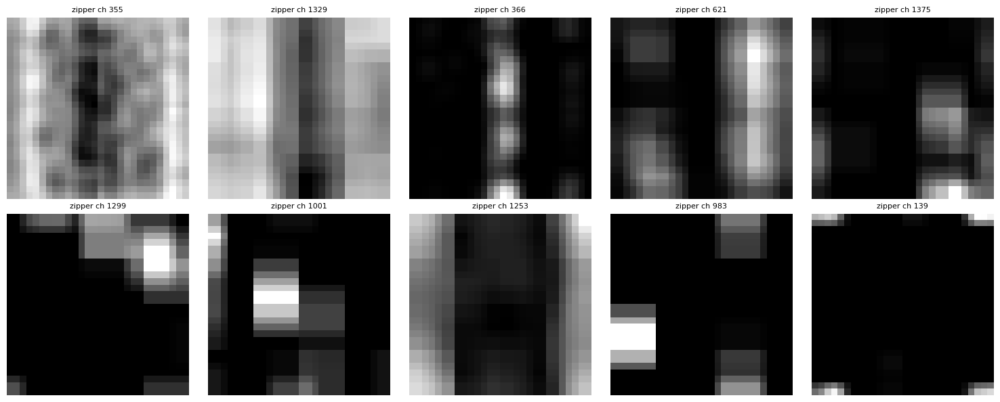

In [5]:
def plot_random_feature_maps(feature_tensor, num_maps=10, title_prefix=""):
    """
    Plots `num_maps` random channels from feature_tensor.
    feature_tensor: Tensor of shape (1, C, H, W)
    """
    _, C, H, W = feature_tensor.shape
    if C < num_maps:
        indices = torch.arange(C)
    else:
        indices = torch.randperm(C)[:num_maps]
    cols = min(num_maps, 5)
    rows = (num_maps + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))
    axes = axes.flatten()
    for i, idx in enumerate(indices):
        fmap = feature_tensor[0, idx].detach().cpu()
        ax = axes[i]
        ax.imshow(fmap, cmap='gray')
        ax.set_title(f"{title_prefix} ch {idx.item()}", fontsize=8)
        ax.axis('off')
    # Turn off unused
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

# Instantiate model once
backbone = resnet_feature_extractor()

# Loop through categories
categories = [cat for cat in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, cat))]
for cat in categories:
    test_path = os.path.join(DATA_DIR, cat, 'test')
    if not os.path.exists(test_path):
        continue

    defect_types = [d for d in os.listdir(test_path)
                    if d != 'good' and os.path.isdir(os.path.join(test_path, d))]
    if not defect_types:
        continue
    defect = defect_types[0]
    defect_dir = os.path.join(test_path, defect)
    img_files = sorted([f for f in os.listdir(defect_dir)
                        if f.lower().endswith(('png', 'jpg', 'jpeg'))])
    if not img_files:
        continue

    img_path = os.path.join(defect_dir, img_files[0])
    image = Image.open(img_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)

    # Extract features
    feature = backbone(input_tensor)
    # feature.shape is (1, 1536, 28, 28) in your setup

    print(f"\nCategory: {cat}, Defect: {defect}")
    print(f" Concatenated feature shape: {tuple(feature.shape)}")

    # Plot original image
    plt.figure(figsize=(4, 4))
    plt.title(f"{cat} - {defect}")
    plt.imshow(input_tensor[0].permute(1, 2, 0))
    plt.axis("off")
    plt.show()

    # Plot random feature maps
    plot_random_feature_maps(feature, num_maps=10, title_prefix=f"{cat}")

### 🧩 6. Convolutional Autoencoder (FeatCAE)

#### 🧱 Defining the `FeatCAE` Class

#### 🔐 Encoder: Compress Feature Maps Using 1x1 Convolutions

#### 🔓 Decoder: Reconstruct Back to Original Feature Shape

#### 🔄 Forward Pass Through Encoder and Decoder

In [6]:
import torch.nn as nn

class FeatCAE(nn.Module):
    """Autoencoder."""

    def __init__(self, in_channels=1000, latent_dim=50, is_bn=True):
        super(FeatCAE, self).__init__()

        layers = []
        layers += [nn.Conv2d(in_channels, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, latent_dim, kernel_size=1, stride=1, padding=0)]

        self.encoder = nn.Sequential(*layers)

        # if 1x1 conv to reconstruct the rgb values, we try to learn a linear combination
        # of the features for rgb
        layers = []
        layers += [nn.Conv2d(latent_dim, 2 * latent_dim, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=2 * latent_dim)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d(2 * latent_dim, (in_channels + 2 * latent_dim) // 2, kernel_size=1, stride=1, padding=0)]
        if is_bn:
            layers += [nn.BatchNorm2d(num_features=(in_channels + 2 * latent_dim) // 2)]
        layers += [nn.ReLU()]
        layers += [nn.Conv2d((in_channels + 2 * latent_dim) // 2, in_channels, kernel_size=1, stride=1, padding=0)]
        # layers += [nn.ReLU()]

        self.decoder = nn.Sequential(*layers)

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

### 🛠️ 7. Training Routine: Feature Autoencoder Per Category

#### ⚙️ `train_one_category()` Function
- Trains the `FeatCAE` using feature maps extracted by the frozen `ResNet50` backbone.
- Tracks and saves best & final models.
- Logs training and validation losses over epochs.

#### 💾 Model Checkpointing
- Best model (`*_best.pth`) and final model (`*_final.pth`) are saved for each category.

#### 📈 Loss Visualization
- Plots training and validation loss curves after training.

#### 🚀 Usage Example
- Device setup and model instantiation for training all categories.

In [11]:
import os
import torch
import torch.optim as optim
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

# def train_one_category(
#     category: str,
#     train_loader,
#     test_loader,
#     backbone,
#     in_channels=1536,
#     latent_dim=100,
#     device=None,
#     num_epochs=50,
#     lr=1e-3,
#     save_root="models/MVTec"
# ):
#     """
#     Train FeatCAE for one category, saving checkpoints and best model.
#     - category: name used for folder/naming
#     - backbone: frozen feature extractor
#     - save_root: base dir to save models, e.g. 'models'
#     """
#     if device is None:
#         device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     backbone = backbone.to(device)
#     backbone.eval()

#     # Prepare save directory
#     os.makedirs(save_root, exist_ok=True)
#     cat_dir = os.path.join(save_root, category)
#     os.makedirs(cat_dir, exist_ok=True)

#     # Instantiate model
#     model = FeatCAE(in_channels=in_channels, latent_dim=latent_dim).to(device)
#     criterion = torch.nn.MSELoss()
#     optimizer = optim.Adam(model.parameters(), lr=lr)

#     train_losses = []
#     val_losses = []
#     best_val = float('inf')
#     best_epoch = -1

#     for epoch in range(1, num_epochs + 1):
#         model.train()
#         running_loss = 0.0
#         total_samples = 0
#         pbar = tqdm(train_loader, desc=f"[{category}] Epoch {epoch}/{num_epochs}", leave=False)
#         for data, _ in pbar:
#             data = data.to(device)
#             with torch.no_grad():
#                 feats = backbone(data)
#             recon = model(feats)
#             loss = criterion(recon, feats)
#             optimizer.zero_grad()
#             loss.backward()
#             optimizer.step()

#             bs = data.size(0)
#             running_loss += loss.item() * bs
#             total_samples += bs
#             pbar.set_postfix({'train_loss': running_loss / total_samples})

#         avg_train_loss = running_loss / total_samples
#         train_losses.append(avg_train_loss)

#         # Validation
#         model.eval()
#         val_running = 0.0
#         val_samples = 0
#         with torch.no_grad():
#             for data, _ in test_loader:
#                 data = data.to(device)
#                 feats = backbone(data)
#                 recon = model(feats)
#                 loss = criterion(recon, feats)
#                 bs = data.size(0)
#                 val_running += loss.item() * bs
#                 val_samples += bs
#         avg_val_loss = val_running / val_samples if val_samples > 0 else float('nan')
#         val_losses.append(avg_val_loss)

#         # Logging
#         if epoch % 5 == 0 or epoch == 1 or epoch == num_epochs:
#             print(f"[{category}] Epoch {epoch}/{num_epochs}  Train Loss: {avg_train_loss:.4f}  Val Loss: {avg_val_loss:.4f}")

#         # Check for best
#         if avg_val_loss < best_val:
#             best_val = avg_val_loss
#             best_epoch = epoch
#             best_path = os.path.join(cat_dir, f"{category}_best.pth")
#             torch.save(model.state_dict(), best_path)

#     # After training: save final model
#     final_path = os.path.join(cat_dir, f"{category}_final.pth")
#     torch.save(model.state_dict(), final_path)
#     print(f"[{category}] Training done. Best val loss: {best_val:.4f} at epoch {best_epoch}.")
#     print(f"Saved final model to {final_path} and best model to {os.path.join(cat_dir, f'{category}_best.pth')}")

#     # Plot losses
#     plt.figure(figsize=(8, 5))
#     plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
#     plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.title(f'{category}: Training & Validation Loss')
#     plt.legend()
#     plt.tight_layout()
#     plt.show()

#     return {
#         'train_losses': train_losses,
#         'val_losses': val_losses,
#         'best_epoch': best_epoch,
#         'best_val_loss': best_val,
#         'final_model_path': final_path,
#         'best_model_path': best_path
#     }

# # === Usage example ===
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
backbone = resnet_feature_extractor().to(DEVICE)
backbone.eval()
# for cat, (train_loader, test_loader) in loaders_dict.items():
#     res = train_one_category(
#         category=cat,
#         train_loader=train_loader,
#         test_loader=test_loader,
#         backbone=backbone,
#         in_channels=1536,
#         latent_dim=100,
#         device=DEVICE,
#         num_epochs=50,
#         lr=1e-3,
#         save_root="models/MVTec"
#     )
#     # res contains paths and loss curves


resnet_feature_extractor(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequent

### 📥 8. Load Trained Models per Category

#### ✅ `load_models_per_category()` Function
- Loads `FeatCAE` models (either `*_best.pth` or `*_final.pth`) from `models/MVTec/<category>/`.
- Skips categories with no saved models and prints a warning.
- Returns a dictionary:  
  `{ 'carpet': model_carpet, 'tile': model_tile, ... }`

#### 🔁 Auto-Detection of Categories
- Uses folder names under `models/MVTec` as category identifiers.

#### ⚠️ Robust to Incomplete Saves
- Tries `best.pth` first, falls back to `final.pth` if missing.

In [8]:
MODEL_ROOT = "models/MVTec"  # base folder where you saved per-category subfolders

def get_categories_from_models(root_dir: str):
    # List subdirectories under root_dir
    return [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]

def load_models_per_category(model_root: str, in_channels=1536, latent_dim=100, device=None):
    """
    Loads the saved FeatCAE for each category into a dict.
    Returns: dict {category: model}
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    loaded = {}
    categories = get_categories_from_models(model_root)
    for cat in categories:
        # Try best checkpoint first
        best_path = os.path.join(model_root, cat, f"{cat}_best.pth")
        final_path = os.path.join(model_root, cat, f"{cat}_final.pth")
        if os.path.isfile(best_path):
            model_path = best_path
        elif os.path.isfile(final_path):
            model_path = final_path
        else:
            print(f"[Warning] No saved model for category '{cat}' in {os.path.join(model_root,cat)}; skipping.")
            continue

        # Instantiate model and load weights
        model = FeatCAE(in_channels=in_channels, latent_dim=latent_dim).to(device)
        state = torch.load(model_path, map_location=device)
        # If saved as a checkpoint dict, extract state_dict
        if isinstance(state, dict) and 'model_state_dict' in state:
            model.load_state_dict(state['model_state_dict'])
        else:
            model.load_state_dict(state)
        model.eval()
        loaded[cat] = model
        print(f"Loaded model for category '{cat}' from '{model_path}'")
    return loaded

# Usage:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaded_models = load_models_per_category(MODEL_ROOT, in_channels=1536, latent_dim=100, device=DEVICE)

C:\Users\shaur\AppData\Local\Temp\ipykernel_24844\1260229218.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(model_path, map_location=device)


Loaded model for category 'bottle' from 'models/MVTec\bottle\bottle_best.pth'
Loaded model for category 'cable' from 'models/MVTec\cable\cable_best.pth'
Loaded model for category 'capsule' from 'models/MVTec\capsule\capsule_best.pth'
Loaded model for category 'carpet' from 'models/MVTec\carpet\carpet_best.pth'
Loaded model for category 'grid' from 'models/MVTec\grid\grid_best.pth'
Loaded model for category 'hazelnut' from 'models/MVTec\hazelnut\hazelnut_best.pth'
Loaded model for category 'leather' from 'models/MVTec\leather\leather_best.pth'
Loaded model for category 'metal_nut' from 'models/MVTec\metal_nut\metal_nut_best.pth'
Loaded model for category 'pill' from 'models/MVTec\pill\pill_best.pth'
Loaded model for category 'screw' from 'models/MVTec\screw\screw_best.pth'
Loaded model for category 'tile' from 'models/MVTec\tile\tile_best.pth'
Loaded model for category 'toothbrush' from 'models/MVTec\toothbrush\toothbrush_best.pth'
Loaded model for category 'transistor' from 'models/MVT

### 🔍 9. Visualizing Segmentation Error Maps

#### 🔁 For Each Loaded Category:
- Selects **one image** from the first available *defect type*.
- Passes it through the frozen ResNet `backbone` → gets feature map.
- Runs the category-specific `FeatCAE` model → gets reconstruction.
- Computes **per-pixel error map** from feature difference:
  \[
  \text{Error} = \frac{1}{C} \sum_{c=1}^{C} (f_c - \hat{f}_c)^2
  \]
- Upsamples error map to `224×224` using bilinear interpolation for visualization.

#### 🖼️ Plot Grid
- Creates a `segmentation heatmap` for each category with jet colormap.
- Arranges results in a `3-column` grid, disables unused subplots.

#### ✅ Result:
Clear **visual intuition** of how well each model reconstructs defective feature regions:
- High error → anomaly
- Low error → normal

This is a qualitative check to **validate model behavior** before full evaluation.


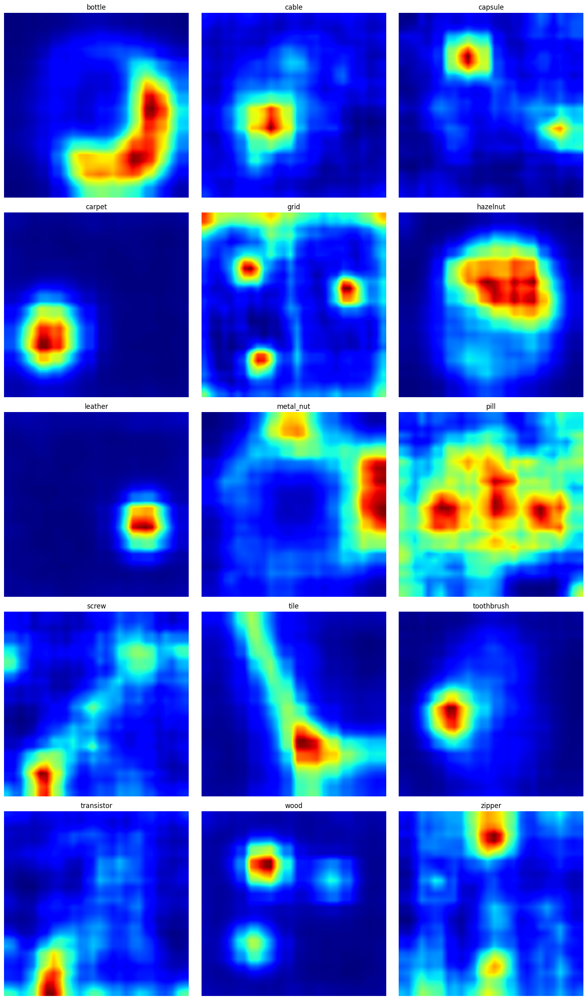

In [12]:
import torch.nn.functional as F
from math import ceil

items = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for cat, model in loaded_models.items():
    # Locate test folder
    test_dir = os.path.join(DATA_DIR, cat, 'test')
    if not os.path.isdir(test_dir):
        print(f"Skipping {cat}: no test dir")
        continue
    # Find first defect subfolder
    defect_types = [d for d in os.listdir(test_dir)
                    if d.lower() != 'good' and os.path.isdir(os.path.join(test_dir, d))]
    if not defect_types:
        print(f"Skipping {cat}: no defect subfolders")
        continue
    defect = defect_types[0]
    defect_dir = os.path.join(test_dir, defect)
    # List image files
    img_files = sorted([f for f in os.listdir(defect_dir)
                        if f.lower().endswith(('png','jpg','jpeg'))])
    if not img_files:
        print(f"Skipping {cat}: no images in {defect_dir}")
        continue
    img_path = os.path.join(defect_dir, img_files[0])
    # Load and preprocess
    img = Image.open(img_path).convert('RGB')
    inp = transform(img).unsqueeze(0).to(device)  # shape (1,3,224,224)

    # Compute features and reconstruction
    with torch.no_grad():
        feat = backbone(inp)               # (1, C, h, w)
        recon = model(feat)                # (1, C, h, w)
        # Compute per-pixel error: mean over channel dim -> shape (1, h, w)
        err_map = ((feat - recon)**2).mean(dim=1, keepdim=True)  # (1,1,h,w)
        # Upscale to input resolution (224×224) via bilinear
        segm_map = F.interpolate(err_map, size=(224,224), mode='bilinear', align_corners=False)  # (1,1,224,224)

    # Move to CPU for plotting
    segm_np = segm_map[0,0].cpu().numpy()
    items.append({'category': cat, 'segm': segm_np})

# Now plot segmentation maps in a grid, 3 per row
n = len(items)
if n == 0:
    print("No segmentation maps to display.")
else:
    cols = 3
    rows = ceil(n / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axs = axs.flatten()
    for idx, item in enumerate(items):
        ax = axs[idx]
        im = ax.imshow(item['segm'], cmap='jet')
        ax.set_title(item['category'])
        ax.axis('off')
        # Optionally add a colorbar per subplot or a single colorbar:
        # For single colorbar, skip here; add after the loop if desired.
    # Turn off unused axes
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')
    plt.tight_layout()
    plt.show()

### 🎯 10. Decision Function: Top‑K Anomaly Scoring

#### 🔧 Inputs
- A batch or list of segmentation maps (each of shape `H×W` or `1×H×W`).

#### ⚙️ Processing Steps
1. **Flatten** each segmentation map into a 1D tensor.
2. **Sort** the flattened values in **descending** order.
3. **Select** the **top 10** highest values.
4. **Compute** the **mean** of those top‑10 values.
5. **Collect** one score per map.

In [13]:
def decision_function(segm_map):  

    mean_top_10_values = []

    for map in segm_map:
        # Flatten the tensor
        flattened_tensor = map.reshape(-1)

        # Sort the flattened tensor along the feature dimension (descending order)
        sorted_tensor, _ = torch.sort(flattened_tensor,descending=True)

        # Take the top 10 values along the feature dimension
        mean_top_10_value = sorted_tensor[:10].mean()

        mean_top_10_values.append(mean_top_10_value)

    return torch.stack(mean_top_10_values)

### 🔢 11. Reconstruction Error Computation & Histogram Visualization

#### 🛠️ Defining `compute_recon_errors_all`
- Loops over all test images (good + defects) per category  
- Computes per-image MSE over feature maps  
- Returns `{category: np.array(errors)}`

#### 📊 Defining `plot_recon_error_histograms`
- Plots error histograms for each category in a 3‑column grid  
- Computes mean + 3 × std as threshold and marks it  

Collected 83 errors for category 'bottle'
Collected 150 errors for category 'cable'
Collected 132 errors for category 'capsule'
Collected 117 errors for category 'carpet'
Collected 78 errors for category 'grid'
Collected 110 errors for category 'hazelnut'
Collected 124 errors for category 'leather'
Collected 115 errors for category 'metal_nut'
Collected 167 errors for category 'pill'
Collected 160 errors for category 'screw'
Collected 117 errors for category 'tile'
Collected 42 errors for category 'toothbrush'
Collected 100 errors for category 'transistor'
Collected 79 errors for category 'wood'
Collected 151 errors for category 'zipper'


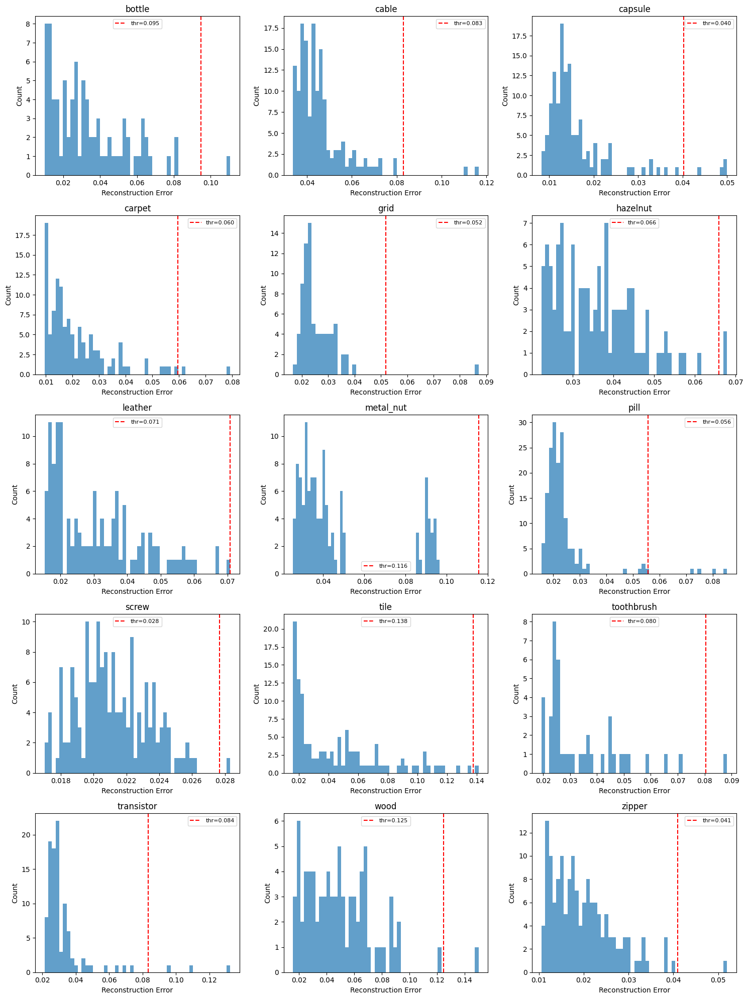

In [14]:
import os
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn.functional as F
from math import ceil

# --- Helper to compute error scores per category ---
def compute_recon_errors_all(DATA_DIR, backbone, loaded_models, transform, device):
    """
    For each category in loaded_models, loop over all test images (good + defects),
    compute per-image reconstruction error (mean squared error over feature map),
    and return dict {category: np.array of errors}.
    """
    recon_errors = {}
    backbone.eval()
    for cat, model in loaded_models.items():
        model.eval()
        test_dir = os.path.join(DATA_DIR, cat, 'test')
        if not os.path.isdir(test_dir):
            print(f"Skipping {cat}: no test dir")
            continue
        errors = []
        # Iterate over subfolders: include 'good' and all defect folders
        subdirs = [d for d in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, d))]
        if not subdirs:
            print(f"Skipping {cat}: no subfolders under test/")
            continue
        for sub in subdirs:
            subdir = os.path.join(test_dir, sub)
            img_files = sorted([f for f in os.listdir(subdir)
                                if f.lower().endswith(('png','jpg','jpeg'))])
            for fname in img_files:
                img_path = os.path.join(subdir, fname)
                img = Image.open(img_path).convert('RGB')
                inp = transform(img).unsqueeze(0).to(device)
                with torch.no_grad():
                    feat = backbone(inp)  # (1, C, h, w)
                    recon = model(feat)
                    # per-image error: mean over channels+spatial
                    err = torch.mean((recon - feat)**2).item()
                errors.append(err)
        if len(errors) == 0:
            print(f"No test images found for {cat}")
            continue
        recon_errors[cat] = np.array(errors, dtype=np.float32)
        print(f"Collected {len(errors)} errors for category '{cat}'")
    return recon_errors

# --- Plotting function from before ---
def plot_recon_error_histograms(recon_errors: dict, bins=50):
    """
    recon_errors: dict mapping category name -> 1D array of error values (numpy or tensor)
    Plots histograms in rows of 3, labeling each subplot by category and drawing threshold.
    """
    categories = list(recon_errors.keys())
    n = len(categories)
    if n == 0:
        print("No reconstruction errors provided.")
        return

    cols = 3
    rows = ceil(n / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    axs = axs.flatten()

    for idx, cat in enumerate(categories):
        errors = recon_errors[cat]
        # Convert tensor to numpy if needed
        if isinstance(errors, torch.Tensor):
            errors = errors.detach().cpu().numpy()
        else:
            errors = np.asarray(errors)

        mean = np.mean(errors)
        std = np.std(errors)
        best_threshold = mean + 3 * std

        ax = axs[idx]
        ax.hist(errors, bins=bins, alpha=0.7)
        ax.axvline(best_threshold, color='r', linestyle='--', label=f"thr={best_threshold:.3f}")
        ax.set_title(cat)
        ax.set_xlabel("Reconstruction Error")
        ax.set_ylabel("Count")
        ax.legend(fontsize=8)

    # Turn off unused subplots
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# --- Usage: compute and plot ---
# Ensure backbone, loaded_models, transform, device, DATA_DIR are defined
recon_errors = compute_recon_errors_all(DATA_DIR, backbone, loaded_models, transform, device)
plot_recon_error_histograms(recon_errors, bins=50)


### 🏁 12. Evaluation & Scoring per Category

#### ⚙️ Ensure Models Are in Eval Mode

#### 🔍 Loop Through Categories & Test Images

#### 🖥️ Preprocess, Extract Features & Reconstruct

#### 🔢 Compute Segmentation Map & Anomaly Score via `decision_function`

#### 📐 Determine Threshold (mean + 3 × std) & Derive Predictions

#### 💾 Store `y_true`, `y_score`, `y_pred`, `threshold` in `results`

#### 📈 Plot Histograms of Anomaly Scores with Threshold Lines (3‑column Grid)

bottle: collected 83 images, threshold=0.465, positives=63/83
cable: collected 150 images, threshold=0.398, positives=92/150
capsule: collected 132 images, threshold=0.263, positives=109/132
carpet: collected 117 images, threshold=0.579, positives=89/117
grid: collected 78 images, threshold=0.197, positives=57/78
hazelnut: collected 110 images, threshold=0.447, positives=70/110
leather: collected 124 images, threshold=0.825, positives=92/124
metal_nut: collected 115 images, threshold=0.254, positives=93/115
pill: collected 167 images, threshold=0.193, positives=141/167
screw: collected 160 images, threshold=0.131, positives=119/160
tile: collected 117 images, threshold=0.650, positives=84/117
toothbrush: collected 42 images, threshold=0.499, positives=30/42
transistor: collected 100 images, threshold=0.258, positives=40/100
wood: collected 79 images, threshold=0.652, positives=60/79
zipper: collected 151 images, threshold=0.233, positives=119/151


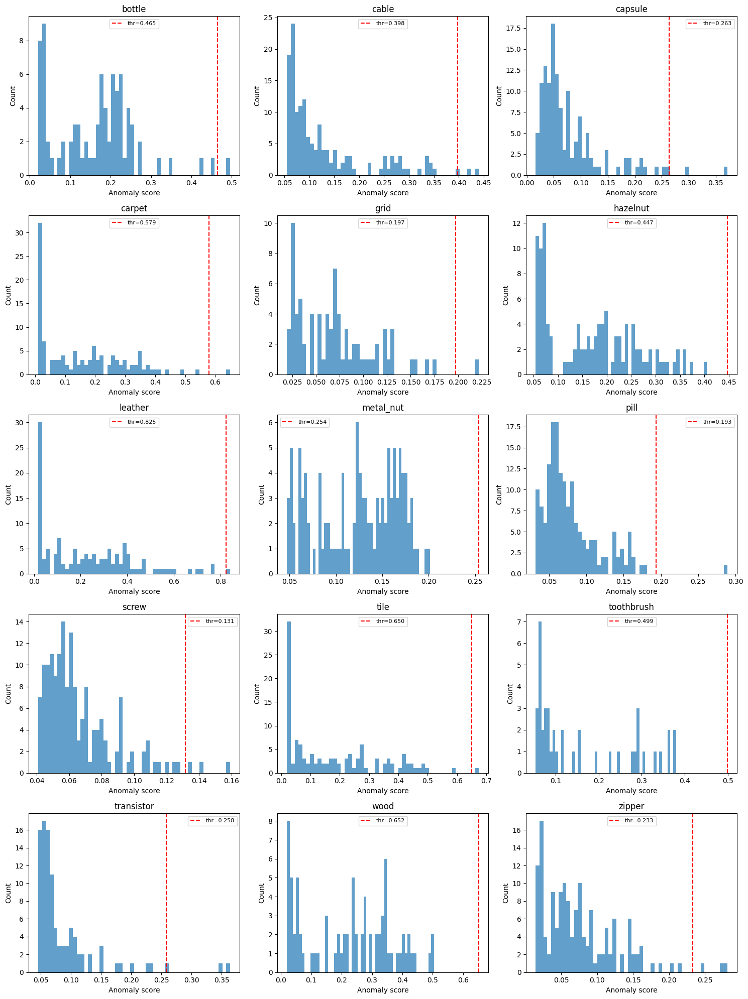

In [15]:
# Ensure backbone and loaded_models are in eval mode on device:
backbone.eval()
for m in loaded_models.values():
    m.eval()

results = {}  # to store y_true, y_score, y_pred, threshold per category

for cat, model in loaded_models.items():
    test_dir = Path(DATA_DIR) / cat / 'test'
    if not test_dir.exists():
        print(f"Skipping {cat}: no test dir")
        continue

    y_true = []
    y_score = []
    # Loop over all images under test/<subfolder>/*.png (or jpg)
    for img_path in test_dir.glob('*/*.png'):
        fault_type = img_path.parent.name  # folder name, e.g. 'good' or defect type
        # Load and preprocess
        img = Image.open(img_path).convert('RGB')
        inp = transform(img).unsqueeze(0).to(device)  # shape (1,3,224,224)
        with torch.no_grad():
            feat = backbone(inp)   # (1, C, h, w)
            recon = model(feat)    # (1, C, h, w)
        # Compute segmentation map: mean squared error over channels
        segm_map = ((feat - recon)**2).mean(dim=1)  # shape (1, h, w)
        # Optional crop borders if desired:
        _, H, W = segm_map.shape
        if H > 6 and W > 6:
            segm_map = segm_map[:, 3:-3, 3:-3]  # shape (1, h-6, w-6)
        # Compute anomaly score via decision_function: expects shape (N, H, W)
        score_tensor = decision_function(segm_map)  # shape (1,)
        score = score_tensor.item()
        y_score.append(score)
        y_true.append(0 if fault_type.lower() == 'good' else 1)

    if len(y_score) == 0:
        print(f"No test images found for {cat}")
        continue

    y_score = np.array(y_score, dtype=np.float32)
    y_true = np.array(y_true, dtype=int)
    mean = y_score.mean()
    std = y_score.std()
    threshold = mean + 3 * std
    y_pred = (y_score >= threshold).astype(int)

    results[cat] = {
        'y_true': y_true,
        'y_score': y_score,
        'y_pred': y_pred,
        'threshold': threshold
    }
    print(f"{cat}: collected {len(y_score)} images, threshold={threshold:.3f}, positives={y_true.sum()}/{len(y_true)}")

# Now plot histograms of y_score with threshold line, 3 per row
categories = list(results.keys())
n = len(categories)
if n == 0:
    print("No categories to plot.")
else:
    cols = 3
    rows = ceil(n / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    axs = axs.flatten()
    for idx, cat in enumerate(categories):
        data = results[cat]
        errors = data['y_score']
        thr = data['threshold']

        ax = axs[idx]
        ax.hist(errors, bins=50, alpha=0.7)
        ax.axvline(thr, color='r', linestyle='--', label=f"thr={thr:.3f}")
        ax.set_title(cat)
        ax.set_xlabel("Anomaly score")
        ax.set_ylabel("Count")
        ax.legend(fontsize=8)

    # Turn off unused subplots
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

### 🔍 13. ROC & Confusion Matrix Evaluation

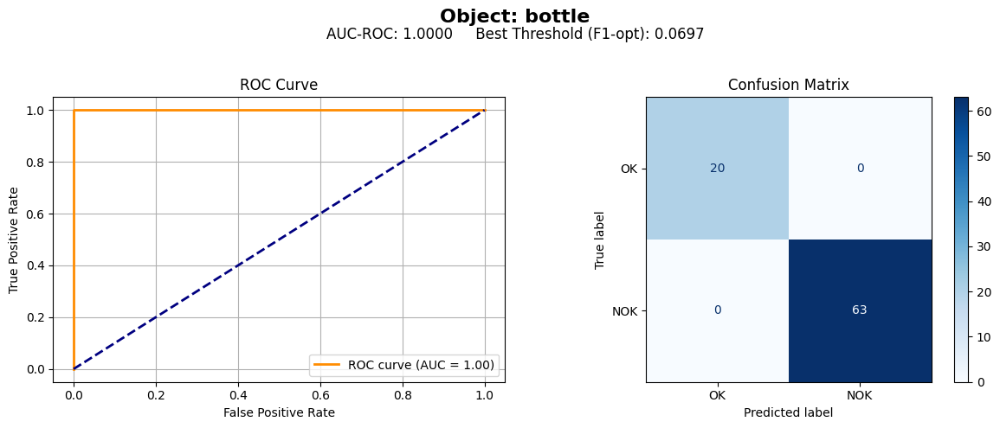

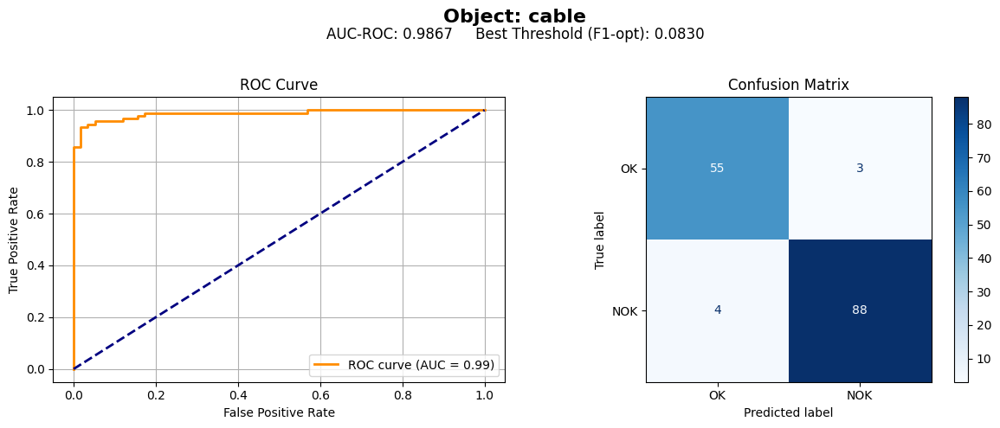

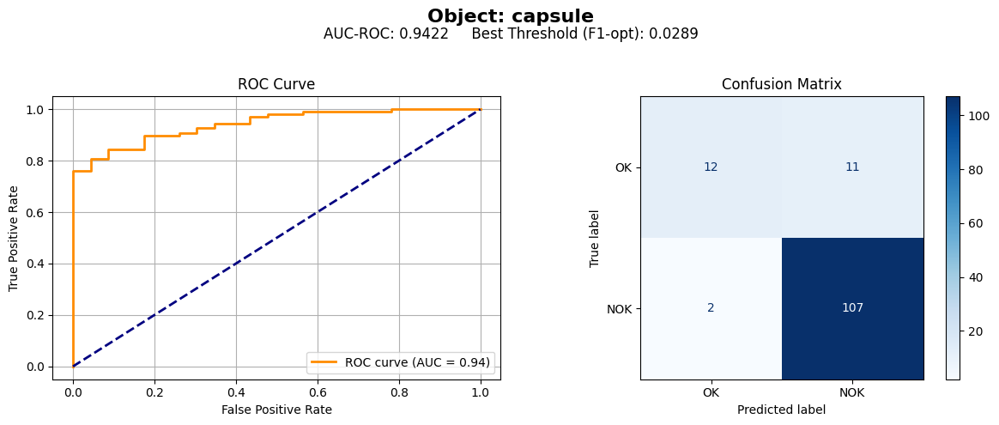

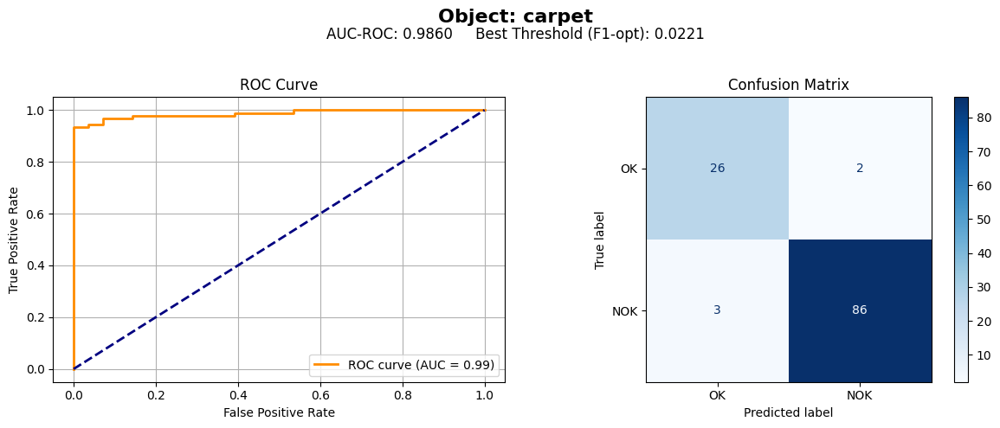

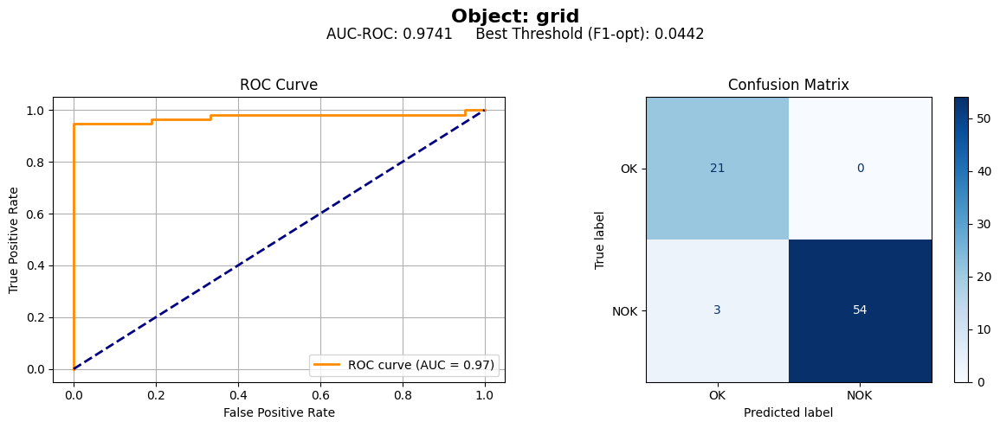

...

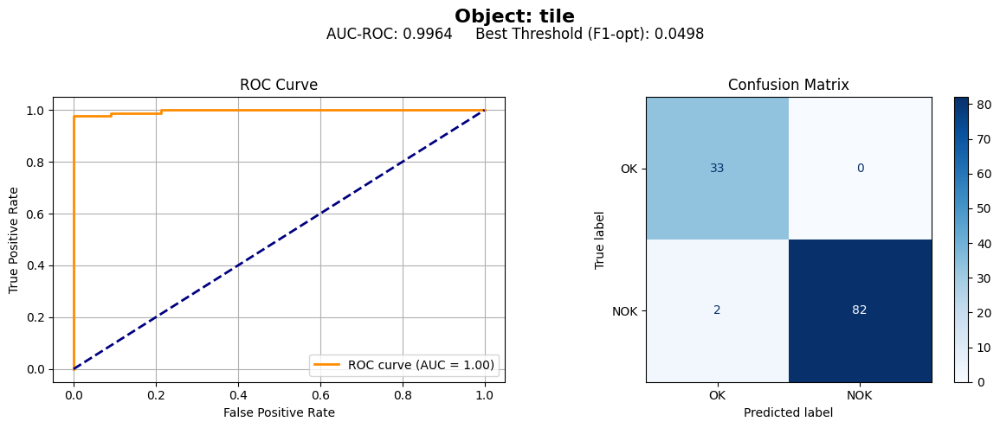

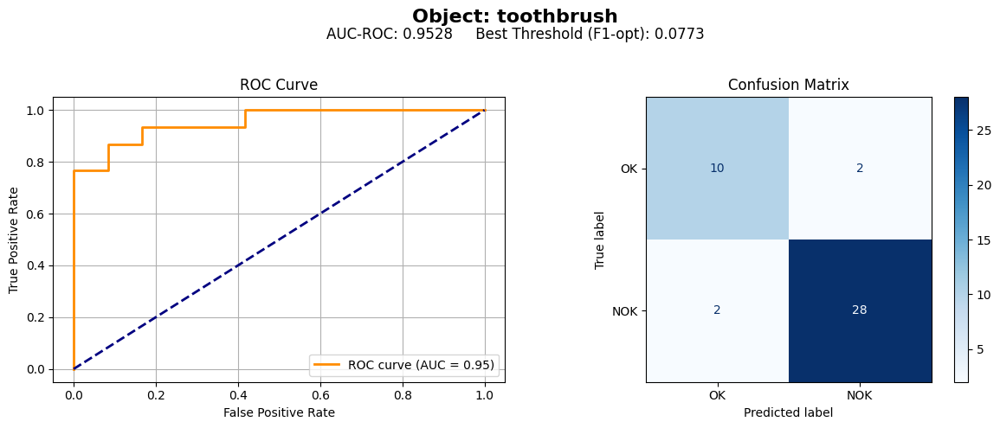

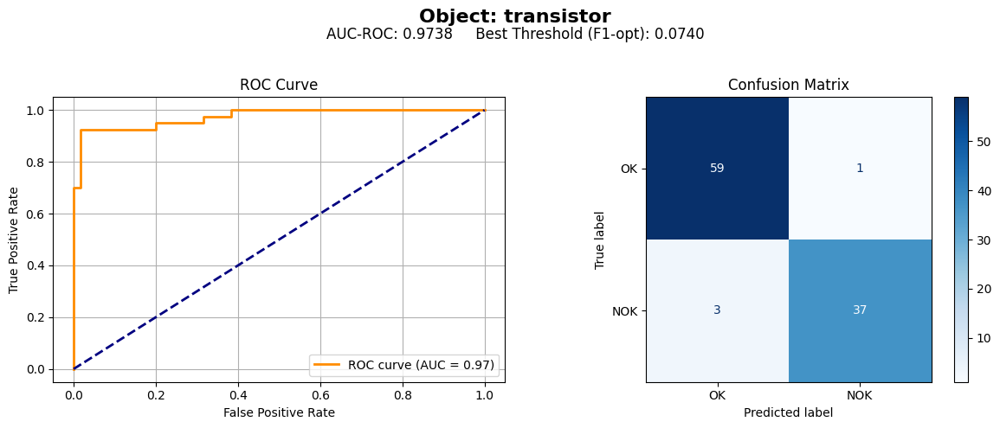

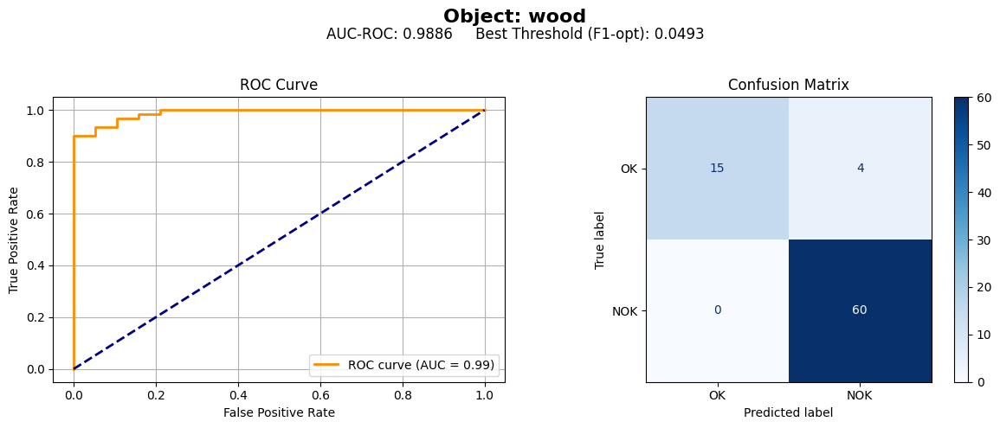

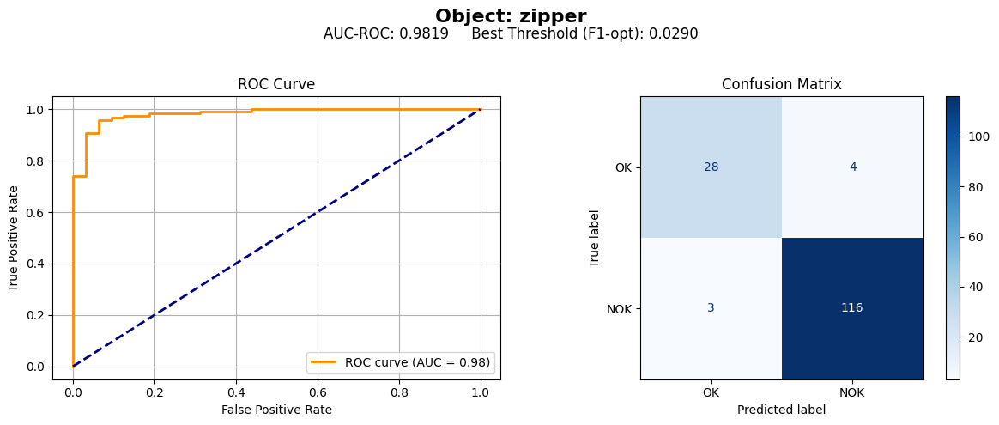

In [16]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay, f1_score
import numpy as np

for cat, data in results.items():
    y_true = data['y_true']
    y_score = data['y_score']
    
    if np.unique(y_true).size < 2:
        print(f"\nObject: {cat}\n[Warning] Only one class in ground truth. Skipping AUC and CM.\n")
        continue

    # --- Metrics ---
    auc_roc = roc_auc_score(y_true, y_score)
    fpr, tpr, thresholds = roc_curve(y_true, y_score)
    f1_scores = [f1_score(y_true, y_score >= thr) for thr in thresholds]
    best_threshold = thresholds[np.argmax(f1_scores)]
    y_pred = (y_score >= best_threshold).astype(int)
    cm = confusion_matrix(y_true, y_pred)

    # --- Layout ---
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"Object: {cat}", fontsize=16, fontweight='bold')

    # Metrics above plots
    plt.figtext(0.5, 0.91,
                f"AUC-ROC: {auc_roc:.4f}     Best Threshold (F1-opt): {best_threshold:.4f}",
                ha='center', fontsize=12)

    # --- ROC Curve ---
    axs[0].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc_roc:.2f})')
    axs[0].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].set_title('ROC Curve')
    axs[0].legend(loc="lower right")
    axs[0].grid(True)

    # --- Confusion Matrix ---
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['OK', 'NOK'])
    disp.plot(ax=axs[1], cmap='Blues', values_format='d')
    axs[1].set_title("Confusion Matrix")

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()


### 🔢 14. AUROC Score Computation & Visualization


📊 AUROC Scores Per Object
-----------------------------------
    Object  AUC-ROC
    bottle   1.0000
     cable   0.9867
   capsule   0.9422
    carpet   0.9860
      grid   0.9741
  hazelnut   1.0000
   leather   1.0000
 metal_nut   0.9961
      pill   0.9427
     screw   0.8596
      tile   0.9964
toothbrush   0.9528
transistor   0.9738
      wood   0.9886
    zipper   0.9819
-----------------------------------


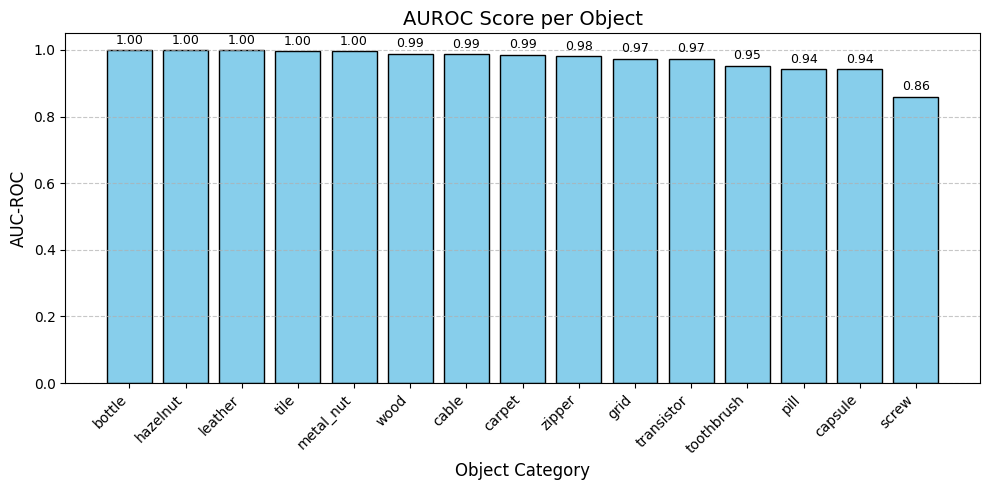

In [17]:
import pandas as pd

# Step 1: Collect AUROC scores
auroc_table = []
for cat, data in results.items():
    y_true = data['y_true']
    y_score = data['y_score']
    
    if np.unique(y_true).size < 2:
        auroc_table.append({'Object': cat, 'AUC-ROC': None})
    else:
        auc_roc = roc_auc_score(y_true, y_score)
        auroc_table.append({'Object': cat, 'AUC-ROC': round(auc_roc, 4)})

# Step 2: Create a DataFrame
df_auroc = pd.DataFrame(auroc_table)

# Step 3: Display as a nice table
print("\n📊 AUROC Scores Per Object\n" + "-" * 35)
print(df_auroc.fillna("N/A (One class only)").to_string(index=False))
print("-" * 35)

# Step 4: Bar plot of valid AUROC scores
plot_df = df_auroc.dropna(subset=["AUC-ROC"]).sort_values(by="AUC-ROC", ascending=False)

plt.figure(figsize=(10, 5))
bars = plt.bar(plot_df["Object"], plot_df["AUC-ROC"], color='skyblue', edgecolor='black')
plt.title("AUROC Score per Object", fontsize=14)
plt.ylabel("AUC-ROC", fontsize=12)
plt.xlabel("Object Category", fontsize=12)
plt.ylim(0, 1.05)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, ha='right')

# Add labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.01, f"{height:.2f}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [18]:
# # Now run the prepare_data script:
# !python utils/prepare_data.py \
#     --split-type 1cls \
#     --data-folder "Dataset/VisA_Raw" \
#     --save-folder "Dataset/VisA" \
#     --split-file "Dataset/VisA_Raw/split_csv/1cls.csv"

### 📂 2. Loading VisA Dataset Categories

In [19]:
DATA_DIR = "Dataset/VisA/1cls"
loaders_dict = get_train_test_loaders_all(DATA_DIR)
for cat, (train_loader, test_loader) in loaders_dict.items():
    print(f"Category: {cat}, #train batches: {len(train_loader)}, #test batches: {len(test_loader)}")

Category: candle, #train batches: 45, #test batches: 12
Category: capsules, #train batches: 28, #test batches: 7
Category: cashew, #train batches: 23, #test batches: 6
Category: chewinggum, #train batches: 23, #test batches: 6
Category: fryum, #train batches: 23, #test batches: 6
Category: macaroni1, #train batches: 45, #test batches: 12
Category: macaroni2, #train batches: 45, #test batches: 12
Category: pcb1, #train batches: 46, #test batches: 12
Category: pcb2, #train batches: 45, #test batches: 12
Category: pcb3, #train batches: 46, #test batches: 12
Category: pcb4, #train batches: 46, #test batches: 12
Category: pipe_fryum, #train batches: 23, #test batches: 6


### 🧬 3. Feature Map Inspection via ResNet Backbone

#### 🔧 Setup:
- Instantiate the ResNet feature extractor once:  
  `backbone = resnet_feature_extractor()`

#### 📥 For Each VisA Category:
- Go to its `test/` folder and pick the **first defect-type image**.
- Run the image through the `backbone`:
  - Extracts intermediate feature maps.
  - Concatenates them to form the full feature representation.
- Logs:
  - Category name & defect type
  - Shape of `feature[0]`, `feature[1]`
  - Final concatenated shape

#### 🖼️ Visualization:
- Shows the input image.
- Displays **feature shape info** as text below each image.
- Arranged in a grid layout with 3 columns.

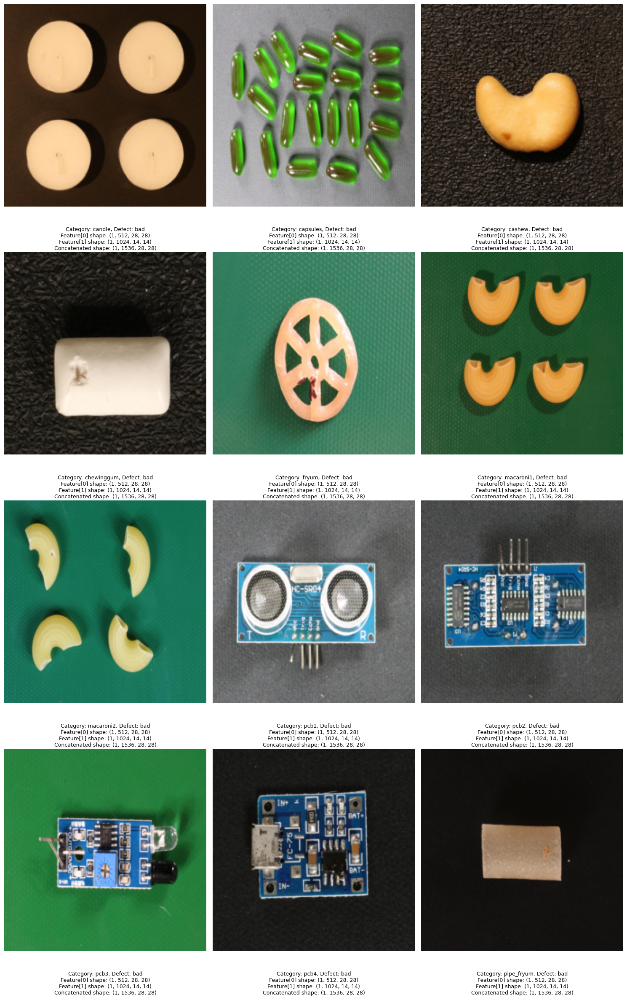

In [20]:
# Instantiate the model once
backbone = resnet_feature_extractor()

# Collect items with image tensor and info text
items = []
categories = [cat for cat in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, cat))]
for cat in categories:
    test_path = os.path.join(DATA_DIR, cat, 'test')
    if not os.path.exists(test_path):
        continue

    # find first defect-type folder (not 'good')
    defect_types = [d for d in os.listdir(test_path)
                    if d != 'good' and os.path.isdir(os.path.join(test_path, d))]
    if not defect_types:
        continue
    defect = defect_types[0]
    defect_dir = os.path.join(test_path, defect)
    img_files = sorted([f for f in os.listdir(defect_dir)
                        if f.lower().endswith(('png', 'jpg', 'jpeg'))])
    if not img_files:
        continue

    img_path = os.path.join(defect_dir, img_files[0])
    image = Image.open(img_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)

    # Forward pass
    feature = backbone(input_tensor)
    f0_shape = tuple(backbone.features[0].shape)
    f1_shape = tuple(backbone.features[1].shape)
    concat_shape = tuple(feature.shape)

    # Prepare the text exactly as printed
    info_text = (
        f"Category: {cat}, Defect: {defect}\n"
        f"Feature[0] shape: {f0_shape}\n"
        f"Feature[1] shape: {f1_shape}\n"
        f"Concatenated shape: {concat_shape}"
    )

    items.append({
        'img_tensor': input_tensor[0],
        'info_text': info_text
    })

# Plot grid: 3 per row, with info below each image
n = len(items)
if n == 0:
    print("No defect images found to display.")
else:
    cols = 3
    rows = (n + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 6 * rows))
    axs = axs.flatten()

    for idx, item in enumerate(items):
        ax = axs[idx]
        # Show image
        ax.imshow(item['img_tensor'].permute(1, 2, 0))
        ax.axis('off')

        # Place info text below: use ax.text in axis coordinates
        # y coordinate < 0 draws below the image area; adjust as needed
        ax.text(
            0.5, -0.1, item['info_text'],
            transform=ax.transAxes,
            ha='center', va='top',
            fontsize=9
        )

    # Turn off unused axes
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

### 🔍 4. Feature Map Extraction & Inspection

#### ⚙️ Using Backbone:
- A frozen `ResNet`-based feature extractor is instantiated:  
  `backbone = resnet_feature_extractor()`

#### 🔁 For Each VisA Category:
- Enters `test/` directory and selects **first available defect-type image**.
- Applies transforms → gets tensor → passes through backbone.
- Backbone returns **concatenated feature map**:
  \[
  \text{Shape: } (1, 1536, 28, 28)
  \]


Category: candle, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


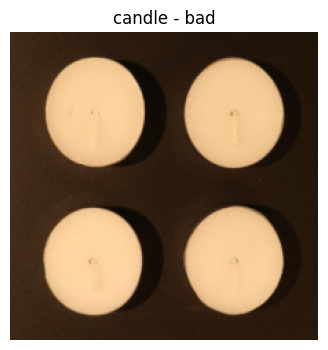

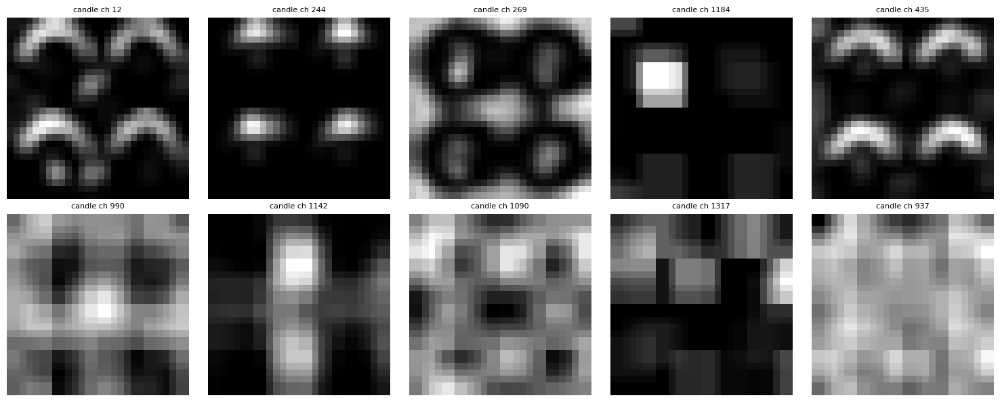


Category: capsules, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


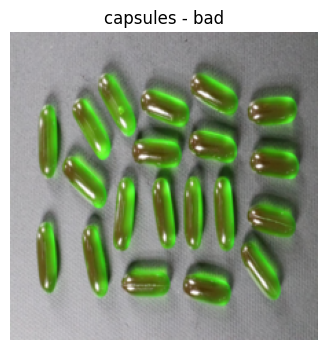

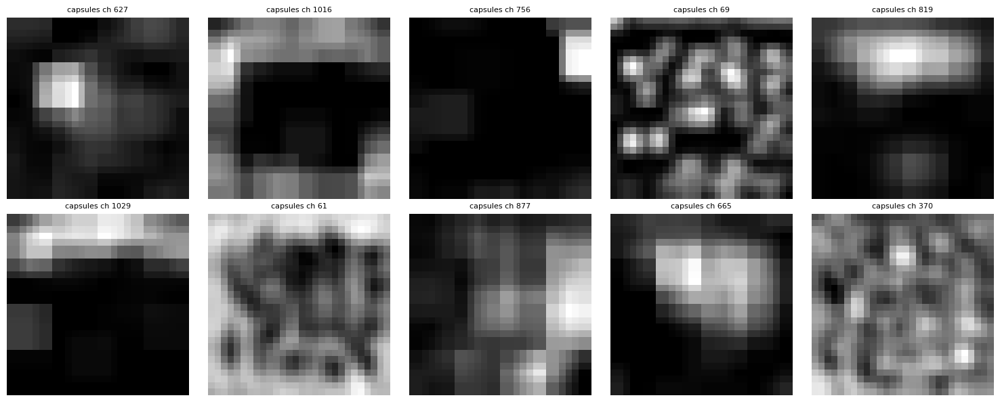


Category: cashew, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


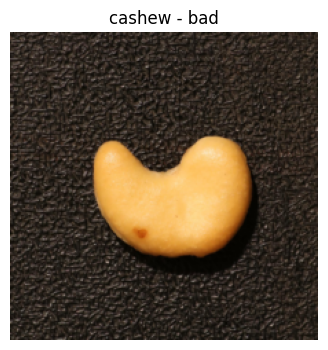

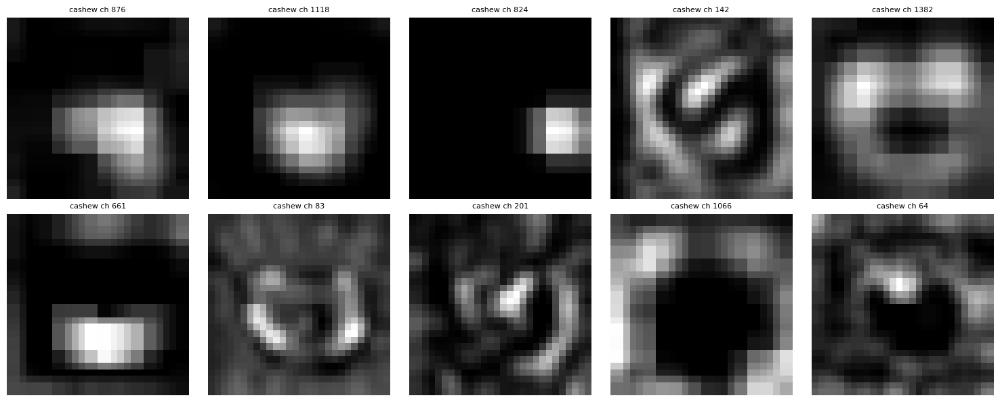


Category: chewinggum, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


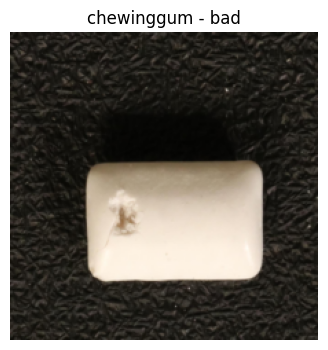

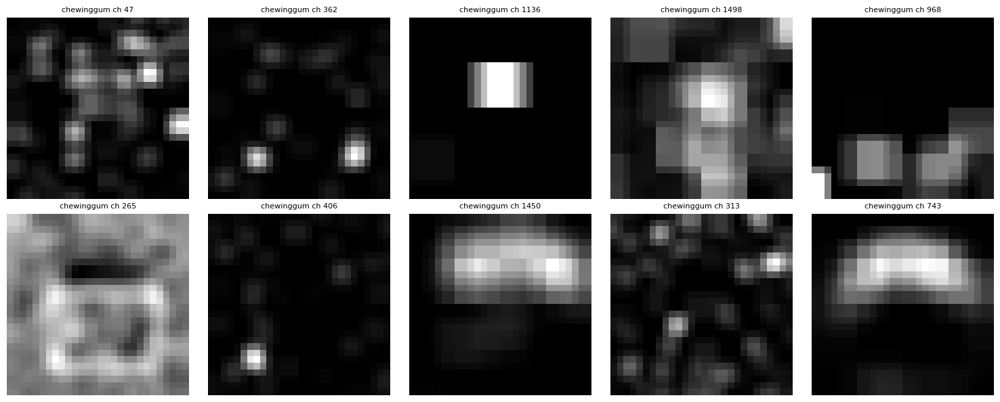


Category: fryum, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


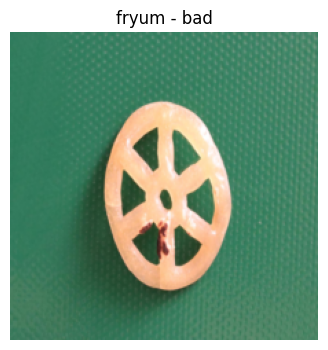

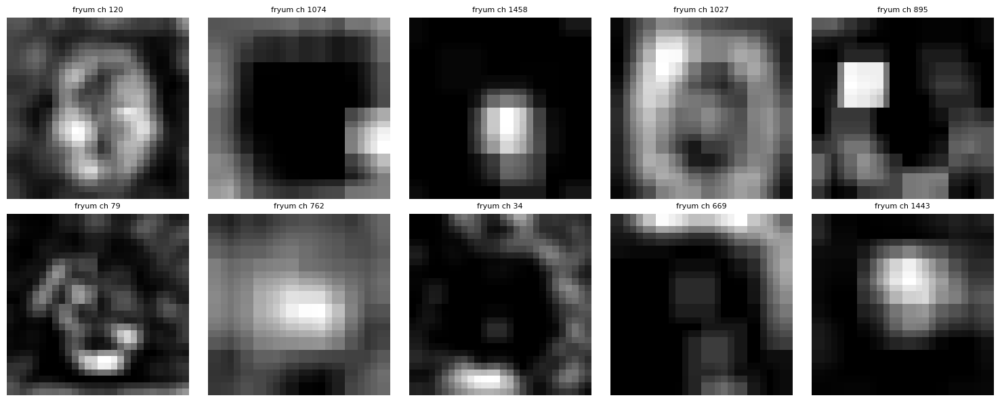


Category: macaroni1, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


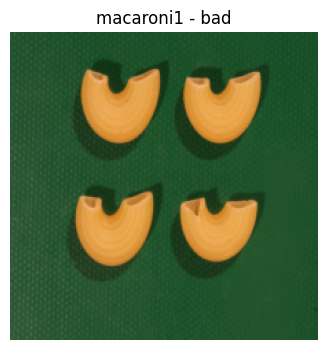

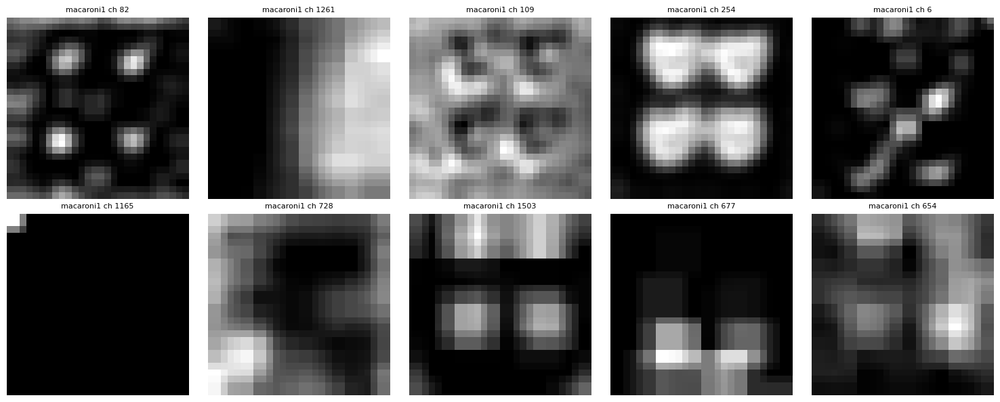


Category: macaroni2, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


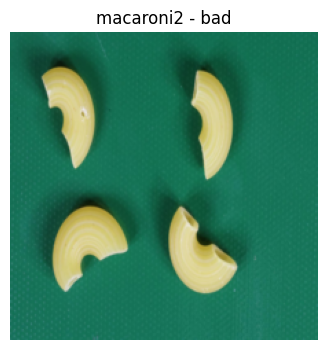

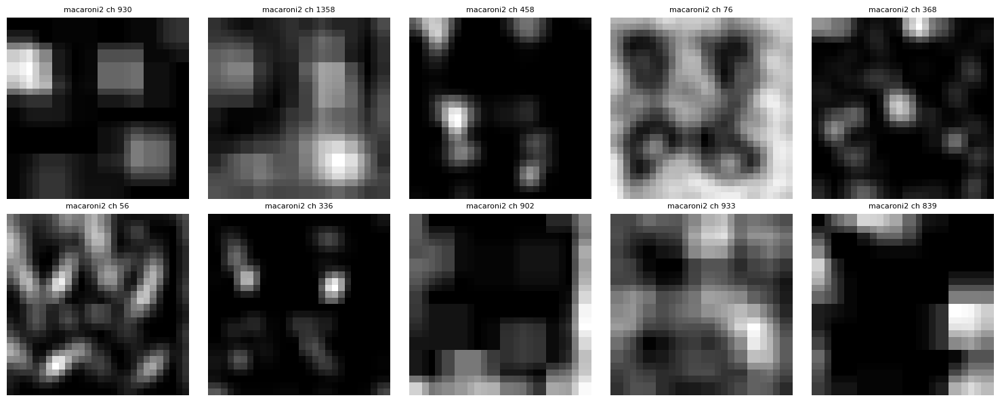


Category: pcb1, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


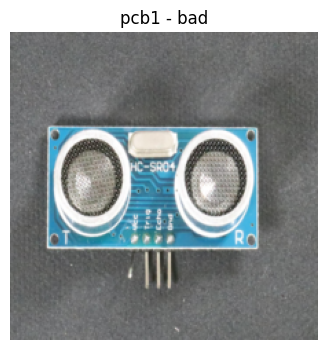

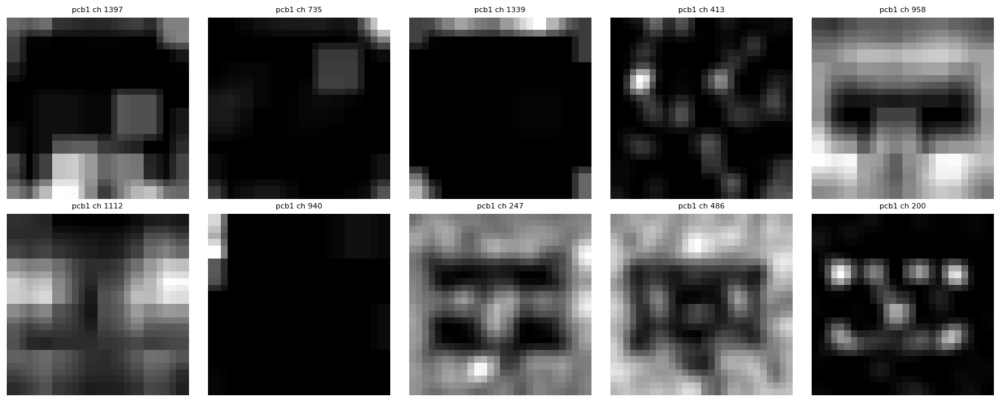


Category: pcb2, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


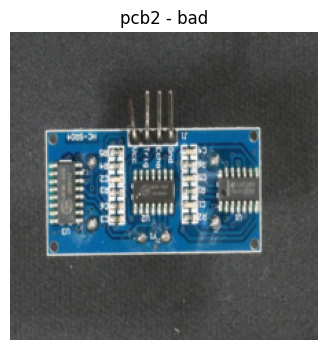

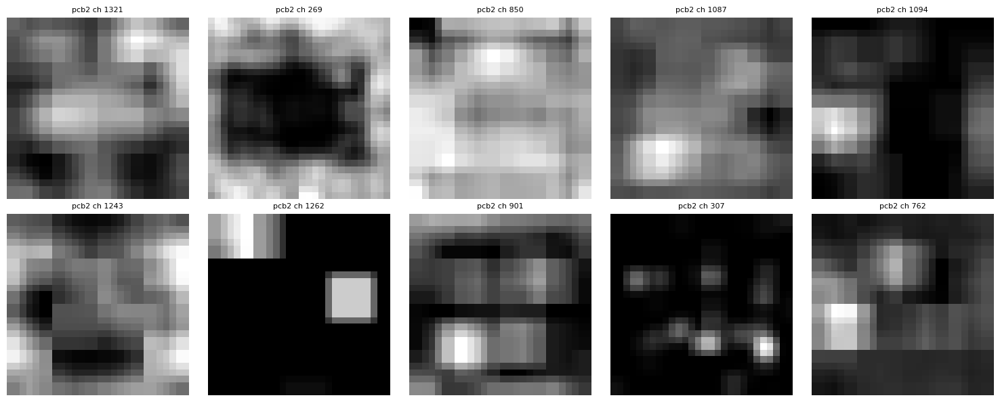


Category: pcb3, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


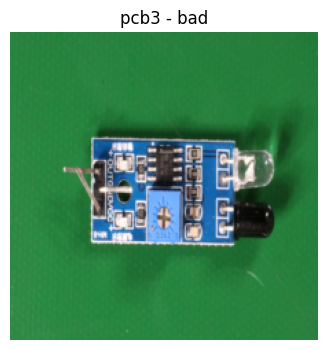

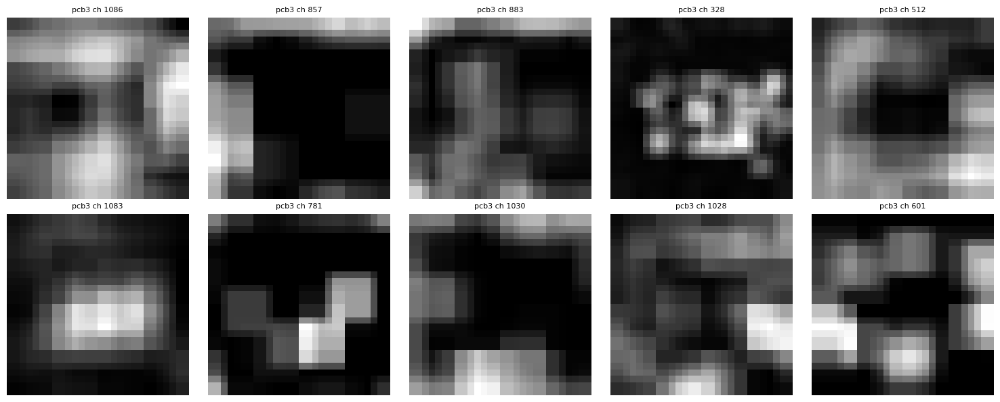


Category: pcb4, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


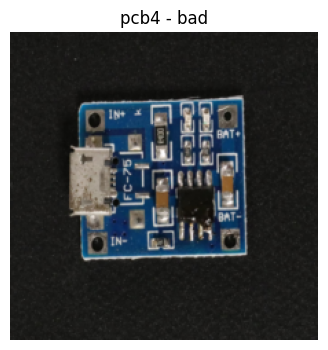

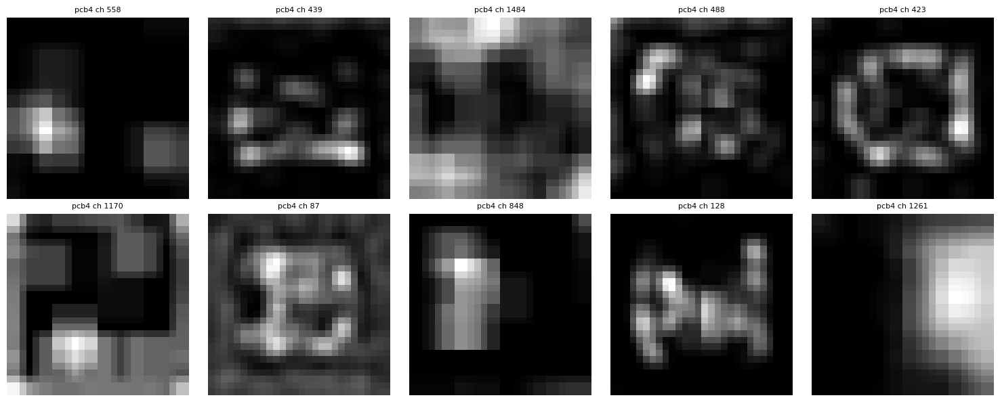


Category: pipe_fryum, Defect: bad
 Concatenated feature shape: (1, 1536, 28, 28)


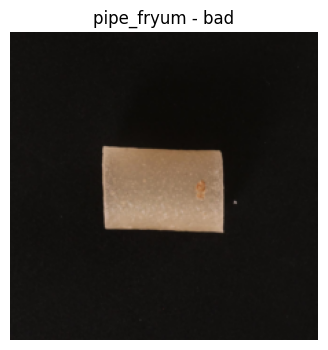

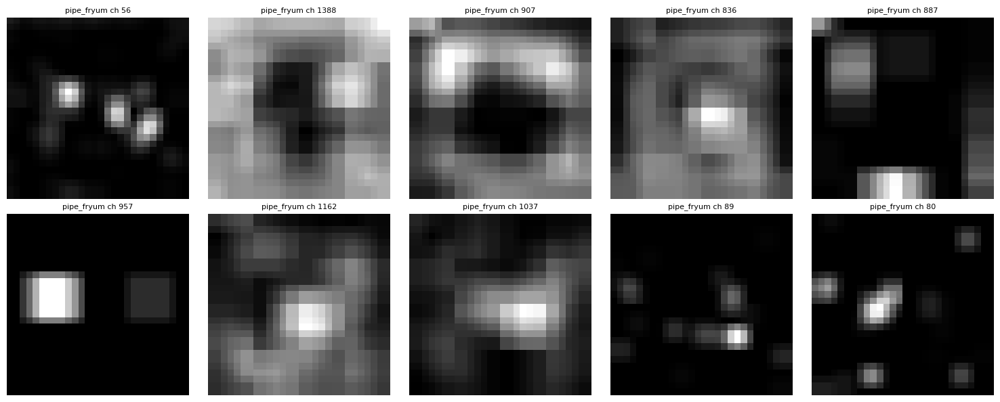

In [21]:
# Instantiate model once
backbone = resnet_feature_extractor()

# Loop through categories
categories = [cat for cat in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, cat))]
for cat in categories:
    test_path = os.path.join(DATA_DIR, cat, 'test')
    if not os.path.exists(test_path):
        continue

    defect_types = [d for d in os.listdir(test_path)
                    if d != 'good' and os.path.isdir(os.path.join(test_path, d))]
    if not defect_types:
        continue
    defect = defect_types[0]
    defect_dir = os.path.join(test_path, defect)
    img_files = sorted([f for f in os.listdir(defect_dir)
                        if f.lower().endswith(('png', 'jpg', 'jpeg'))])
    if not img_files:
        continue

    img_path = os.path.join(defect_dir, img_files[0])
    image = Image.open(img_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)

    # Extract features
    feature = backbone(input_tensor)
    # feature.shape is (1, 1536, 28, 28) in your setup

    print(f"\nCategory: {cat}, Defect: {defect}")
    print(f" Concatenated feature shape: {tuple(feature.shape)}")

    # Plot original image
    plt.figure(figsize=(4, 4))
    plt.title(f"{cat} - {defect}")
    plt.imshow(input_tensor[0].permute(1, 2, 0))
    plt.axis("off")
    plt.show()

    # Plot random feature maps
    plot_random_feature_maps(feature, num_maps=10, title_prefix=f"{cat}")

### 🧪 5. Training Category-Specific FeatCAE Models

#### ⚙️ Function: `train_one_category(...)`
Trains a `FeatCAE` (Feature Autoencoder) for **each category** using backbone features.

##### 🔧 Inputs:
- `category`: string (e.g., `capsule`, `bottle`)
- `train_loader`, `test_loader`: Dataloaders for this category
- `backbone`: frozen ResNet feature extractor
- `latent_dim`: bottleneck size (default: `100`)
- `num_epochs`: default `50`
- `save_root`: where model checkpoints go (e.g., `models/VisA`)

##### 🧠 Training Loop:
1. Forward pass: `feat = backbone(img)` → `recon = FeatCAE(feat)`
2. Loss: Mean Squared Error between `feat` and `recon`
3. Tracks best validation loss and saves:
   - `category_best.pth`
   - `category_final.pth`
4. Logs training and validation loss every 5 epochs.

##### 📊 Output:
- Line plot of training vs. validation loss.
- Returns dictionary with:
  - Loss histories
  - Best epoch
  - Paths to saved models

---

### 📈 Result: Model Checkpoints per Category
Each trained model is saved to disk:
- `models/VisA/capsule/capsule_best.pth`
- `models/VisA/bottle/bottle_final.pth`
...and so on.

[candle] Epoch 1/50  Train Loss: 0.1472  Val Loss: 0.0318


[candle] Epoch 5/50  Train Loss: 0.0142  Val Loss: 0.0138


[candle] Epoch 10/50  Train Loss: 0.0107  Val Loss: 0.0108


[candle] Epoch 15/50  Train Loss: 0.0093  Val Loss: 0.0093


[candle] Epoch 20/50  Train Loss: 0.0084  Val Loss: 0.0087


[candle] Epoch 25/50  Train Loss: 0.0076  Val Loss: 0.0078


[candle] Epoch 30/50  Train Loss: 0.0073  Val Loss: 0.0072


[candle] Epoch 35/50  Train Loss: 0.0068  Val Loss: 0.0069


[candle] Epoch 40/50  Train Loss: 0.0066  Val Loss: 0.0066


[candle] Epoch 45/50  Train Loss: 0.0063  Val Loss: 0.0066


[candle] Epoch 50/50  Train Loss: 0.0061  Val Loss: 0.0063
[candle] Training done. Best val loss: 0.0062 at epoch 48.
Saved final model to models/VisA\candle\candle_final.pth and best model to models/VisA\candle\candle_best.pth


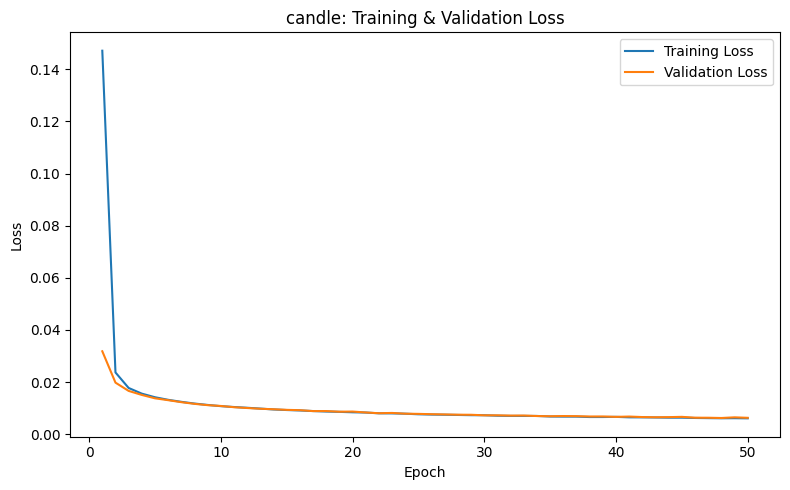

[capsules] Epoch 1/50  Train Loss: 0.2792  Val Loss: 0.1217


[capsules] Epoch 5/50  Train Loss: 0.0635  Val Loss: 0.0605


[capsules] Epoch 10/50  Train Loss: 0.0497  Val Loss: 0.0491


[capsules] Epoch 15/50  Train Loss: 0.0433  Val Loss: 0.0440


[capsules] Epoch 20/50  Train Loss: 0.0403  Val Loss: 0.0398


[capsules] Epoch 25/50  Train Loss: 0.0378  Val Loss: 0.0424


[capsules] Epoch 30/50  Train Loss: 0.0360  Val Loss: 0.0381


[capsules] Epoch 35/50  Train Loss: 0.0349  Val Loss: 0.0365


[capsules] Epoch 40/50  Train Loss: 0.0333  Val Loss: 0.0343


[capsules] Epoch 45/50  Train Loss: 0.0318  Val Loss: 0.0333


[capsules] Epoch 50/50  Train Loss: 0.0317  Val Loss: 0.0343
[capsules] Training done. Best val loss: 0.0325 at epoch 47.
Saved final model to models/VisA\capsules\capsules_final.pth and best model to models/VisA\capsules\capsules_best.pth


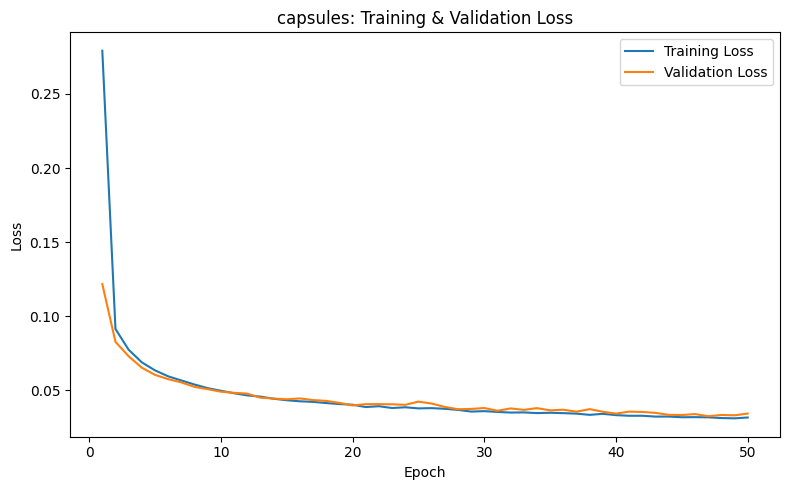

[cashew] Epoch 1/50  Train Loss: 0.2461  Val Loss: 0.0855


[cashew] Epoch 5/50  Train Loss: 0.0319  Val Loss: 0.0310


[cashew] Epoch 10/50  Train Loss: 0.0259  Val Loss: 0.0256


[cashew] Epoch 15/50  Train Loss: 0.0221  Val Loss: 0.0219


[cashew] Epoch 20/50  Train Loss: 0.0196  Val Loss: 0.0197


[cashew] Epoch 25/50  Train Loss: 0.0180  Val Loss: 0.0181


[cashew] Epoch 30/50  Train Loss: 0.0167  Val Loss: 0.0167


[cashew] Epoch 35/50  Train Loss: 0.0159  Val Loss: 0.0161


[cashew] Epoch 40/50  Train Loss: 0.0150  Val Loss: 0.0152


[cashew] Epoch 45/50  Train Loss: 0.0146  Val Loss: 0.0147


[cashew] Epoch 50/50  Train Loss: 0.0141  Val Loss: 0.0144
[cashew] Training done. Best val loss: 0.0143 at epoch 49.
Saved final model to models/VisA\cashew\cashew_final.pth and best model to models/VisA\cashew\cashew_best.pth


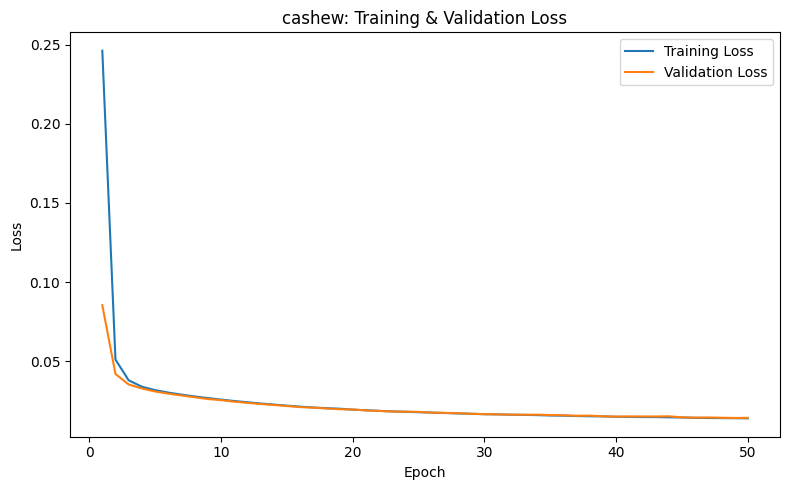

[chewinggum] Epoch 1/50  Train Loss: 0.2564  Val Loss: 0.0941


[chewinggum] Epoch 5/50  Train Loss: 0.0401  Val Loss: 0.0391


[chewinggum] Epoch 10/50  Train Loss: 0.0321  Val Loss: 0.0313


[chewinggum] Epoch 15/50  Train Loss: 0.0272  Val Loss: 0.0269


[chewinggum] Epoch 20/50  Train Loss: 0.0242  Val Loss: 0.0240


[chewinggum] Epoch 25/50  Train Loss: 0.0223  Val Loss: 0.0223


[chewinggum] Epoch 30/50  Train Loss: 0.0208  Val Loss: 0.0211


[chewinggum] Epoch 35/50  Train Loss: 0.0196  Val Loss: 0.0203


[chewinggum] Epoch 40/50  Train Loss: 0.0188  Val Loss: 0.0190


[chewinggum] Epoch 45/50  Train Loss: 0.0181  Val Loss: 0.0187


[chewinggum] Epoch 50/50  Train Loss: 0.0174  Val Loss: 0.0176
[chewinggum] Training done. Best val loss: 0.0176 at epoch 50.
Saved final model to models/VisA\chewinggum\chewinggum_final.pth and best model to models/VisA\chewinggum\chewinggum_best.pth


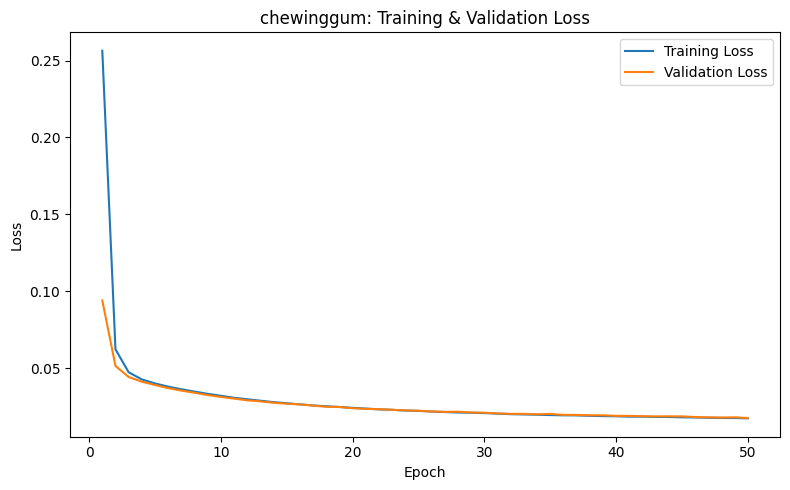

[fryum] Epoch 1/50  Train Loss: 0.2597  Val Loss: 0.0888


[fryum] Epoch 5/50  Train Loss: 0.0304  Val Loss: 0.0302


[fryum] Epoch 10/50  Train Loss: 0.0232  Val Loss: 0.0236


[fryum] Epoch 15/50  Train Loss: 0.0199  Val Loss: 0.0201


[fryum] Epoch 20/50  Train Loss: 0.0176  Val Loss: 0.0182


[fryum] Epoch 25/50  Train Loss: 0.0161  Val Loss: 0.0165


[fryum] Epoch 30/50  Train Loss: 0.0150  Val Loss: 0.0157


[fryum] Epoch 35/50  Train Loss: 0.0143  Val Loss: 0.0145


[fryum] Epoch 40/50  Train Loss: 0.0138  Val Loss: 0.0140


[fryum] Epoch 45/50  Train Loss: 0.0130  Val Loss: 0.0135


[fryum] Epoch 50/50  Train Loss: 0.0127  Val Loss: 0.0135
[fryum] Training done. Best val loss: 0.0132 at epoch 48.
Saved final model to models/VisA\fryum\fryum_final.pth and best model to models/VisA\fryum\fryum_best.pth


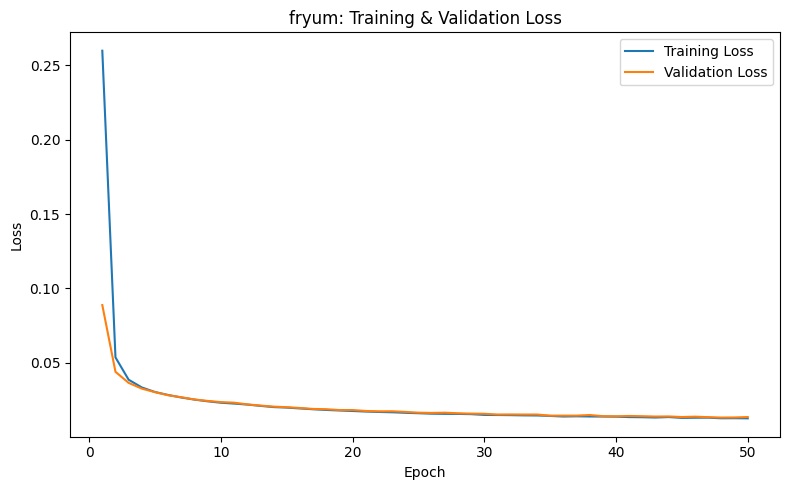

[macaroni1] Epoch 1/50  Train Loss: 0.1647  Val Loss: 0.0475


[macaroni1] Epoch 5/50  Train Loss: 0.0255  Val Loss: 0.0245


[macaroni1] Epoch 10/50  Train Loss: 0.0193  Val Loss: 0.0188


[macaroni1] Epoch 15/50  Train Loss: 0.0168  Val Loss: 0.0163


[macaroni1] Epoch 20/50  Train Loss: 0.0150  Val Loss: 0.0149


[macaroni1] Epoch 25/50  Train Loss: 0.0138  Val Loss: 0.0138


[macaroni1] Epoch 30/50  Train Loss: 0.0133  Val Loss: 0.0131


[macaroni1] Epoch 35/50  Train Loss: 0.0126  Val Loss: 0.0127


[macaroni1] Epoch 40/50  Train Loss: 0.0122  Val Loss: 0.0122


[macaroni1] Epoch 45/50  Train Loss: 0.0119  Val Loss: 0.0116


[macaroni1] Epoch 50/50  Train Loss: 0.0114  Val Loss: 0.0114
[macaroni1] Training done. Best val loss: 0.0114 at epoch 50.
Saved final model to models/VisA\macaroni1\macaroni1_final.pth and best model to models/VisA\macaroni1\macaroni1_best.pth


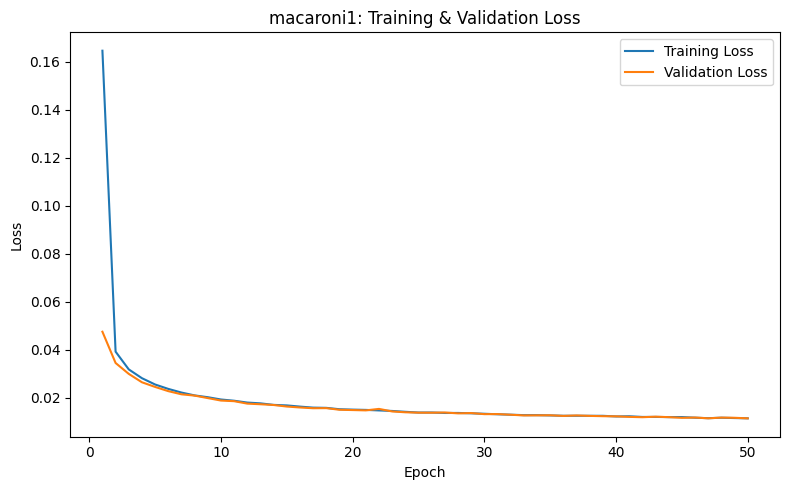

[macaroni2] Epoch 1/50  Train Loss: 0.1913  Val Loss: 0.0765


[macaroni2] Epoch 5/50  Train Loss: 0.0422  Val Loss: 0.0404


[macaroni2] Epoch 10/50  Train Loss: 0.0320  Val Loss: 0.0309


[macaroni2] Epoch 15/50  Train Loss: 0.0280  Val Loss: 0.0272


[macaroni2] Epoch 20/50  Train Loss: 0.0252  Val Loss: 0.0253


[macaroni2] Epoch 25/50  Train Loss: 0.0237  Val Loss: 0.0236


[macaroni2] Epoch 30/50  Train Loss: 0.0224  Val Loss: 0.0224


[macaroni2] Epoch 35/50  Train Loss: 0.0216  Val Loss: 0.0216


[macaroni2] Epoch 40/50  Train Loss: 0.0207  Val Loss: 0.0205


[macaroni2] Epoch 45/50  Train Loss: 0.0199  Val Loss: 0.0199


[macaroni2] Epoch 50/50  Train Loss: 0.0194  Val Loss: 0.0204
[macaroni2] Training done. Best val loss: 0.0193 at epoch 49.
Saved final model to models/VisA\macaroni2\macaroni2_final.pth and best model to models/VisA\macaroni2\macaroni2_best.pth


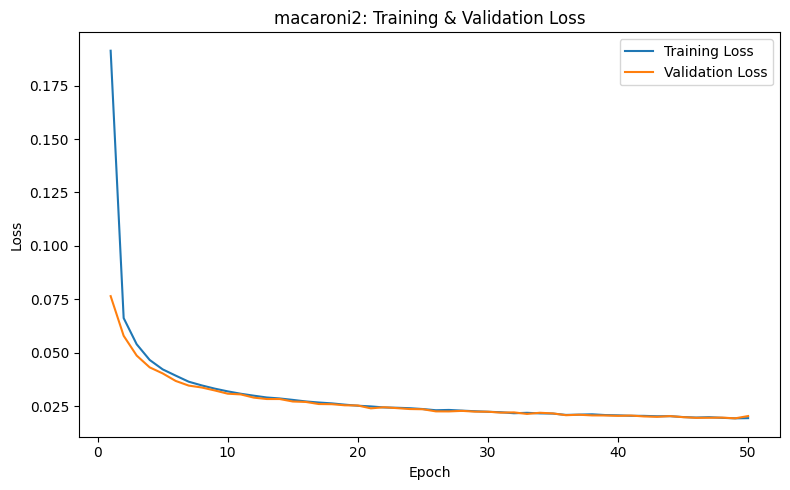

[pcb1] Epoch 1/50  Train Loss: 0.1763  Val Loss: 0.0615


[pcb1] Epoch 5/50  Train Loss: 0.0315  Val Loss: 0.0307


[pcb1] Epoch 10/50  Train Loss: 0.0246  Val Loss: 0.0246


[pcb1] Epoch 15/50  Train Loss: 0.0211  Val Loss: 0.0218


[pcb1] Epoch 20/50  Train Loss: 0.0192  Val Loss: 0.0199


[pcb1] Epoch 25/50  Train Loss: 0.0180  Val Loss: 0.0190


[pcb1] Epoch 30/50  Train Loss: 0.0169  Val Loss: 0.0178


[pcb1] Epoch 35/50  Train Loss: 0.0163  Val Loss: 0.0168


[pcb1] Epoch 40/50  Train Loss: 0.0157  Val Loss: 0.0165


[pcb1] Epoch 45/50  Train Loss: 0.0152  Val Loss: 0.0156


[pcb1] Epoch 50/50  Train Loss: 0.0148  Val Loss: 0.0154
[pcb1] Training done. Best val loss: 0.0154 at epoch 50.
Saved final model to models/VisA\pcb1\pcb1_final.pth and best model to models/VisA\pcb1\pcb1_best.pth


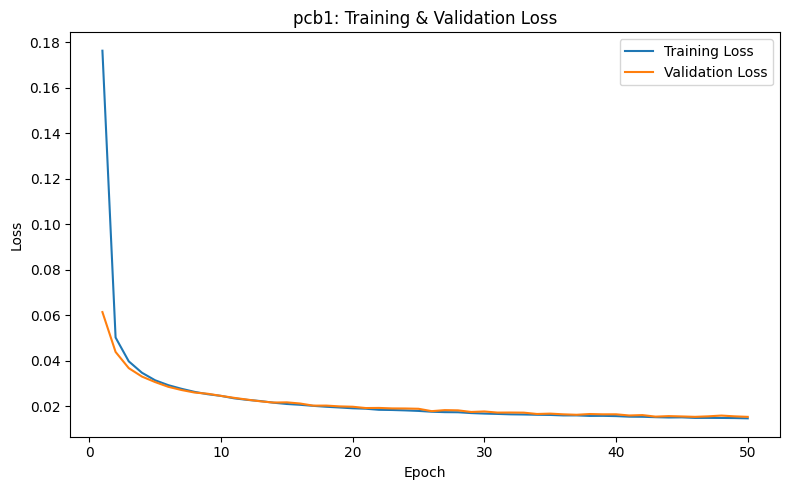

[pcb2] Epoch 1/50  Train Loss: 0.1585  Val Loss: 0.0504


[pcb2] Epoch 5/50  Train Loss: 0.0294  Val Loss: 0.0283


[pcb2] Epoch 10/50  Train Loss: 0.0234  Val Loss: 0.0228


[pcb2] Epoch 15/50  Train Loss: 0.0202  Val Loss: 0.0200


[pcb2] Epoch 20/50  Train Loss: 0.0182  Val Loss: 0.0182


[pcb2] Epoch 25/50  Train Loss: 0.0169  Val Loss: 0.0167


[pcb2] Epoch 30/50  Train Loss: 0.0160  Val Loss: 0.0158


[pcb2] Epoch 35/50  Train Loss: 0.0152  Val Loss: 0.0153


[pcb2] Epoch 40/50  Train Loss: 0.0147  Val Loss: 0.0150


[pcb2] Epoch 45/50  Train Loss: 0.0141  Val Loss: 0.0143


[pcb2] Epoch 50/50  Train Loss: 0.0138  Val Loss: 0.0138
[pcb2] Training done. Best val loss: 0.0138 at epoch 50.
Saved final model to models/VisA\pcb2\pcb2_final.pth and best model to models/VisA\pcb2\pcb2_best.pth


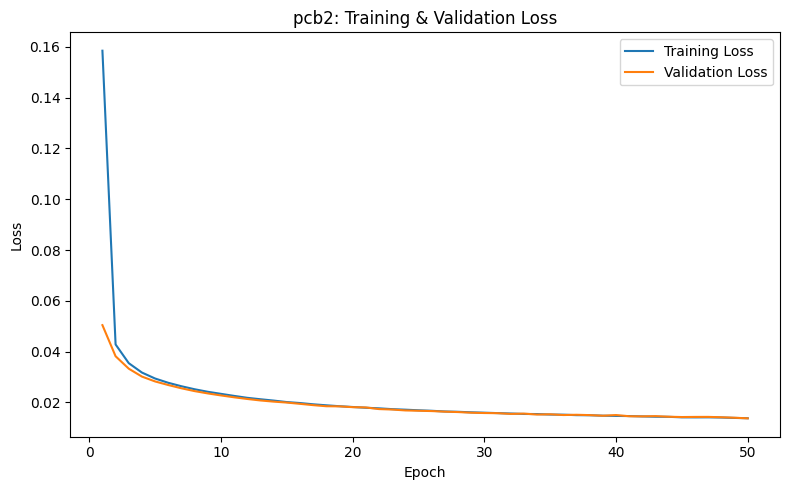

[pcb3] Epoch 1/50  Train Loss: 0.1644  Val Loss: 0.0530


[pcb3] Epoch 5/50  Train Loss: 0.0313  Val Loss: 0.0307


[pcb3] Epoch 10/50  Train Loss: 0.0244  Val Loss: 0.0245


[pcb3] Epoch 15/50  Train Loss: 0.0212  Val Loss: 0.0213


[pcb3] Epoch 20/50  Train Loss: 0.0193  Val Loss: 0.0197


[pcb3] Epoch 25/50  Train Loss: 0.0180  Val Loss: 0.0184


[pcb3] Epoch 30/50  Train Loss: 0.0169  Val Loss: 0.0175


[pcb3] Epoch 35/50  Train Loss: 0.0162  Val Loss: 0.0168


[pcb3] Epoch 40/50  Train Loss: 0.0157  Val Loss: 0.0163


[pcb3] Epoch 45/50  Train Loss: 0.0152  Val Loss: 0.0157


[pcb3] Epoch 50/50  Train Loss: 0.0147  Val Loss: 0.0153
[pcb3] Training done. Best val loss: 0.0153 at epoch 50.
Saved final model to models/VisA\pcb3\pcb3_final.pth and best model to models/VisA\pcb3\pcb3_best.pth


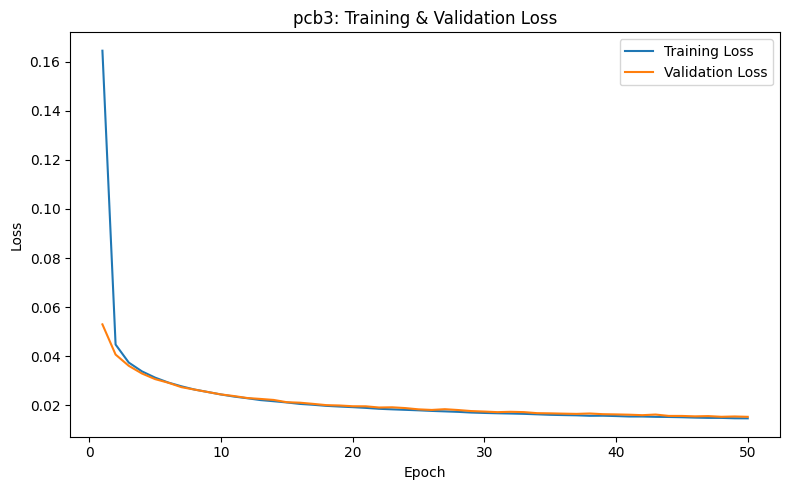

[pcb4] Epoch 1/50  Train Loss: 0.1547  Val Loss: 0.0455


[pcb4] Epoch 5/50  Train Loss: 0.0274  Val Loss: 0.0265


[pcb4] Epoch 10/50  Train Loss: 0.0213  Val Loss: 0.0213


[pcb4] Epoch 15/50  Train Loss: 0.0184  Val Loss: 0.0182


[pcb4] Epoch 20/50  Train Loss: 0.0166  Val Loss: 0.0168


[pcb4] Epoch 25/50  Train Loss: 0.0154  Val Loss: 0.0156


[pcb4] Epoch 30/50  Train Loss: 0.0145  Val Loss: 0.0161


[pcb4] Epoch 35/50  Train Loss: 0.0139  Val Loss: 0.0140


[pcb4] Epoch 40/50  Train Loss: 0.0133  Val Loss: 0.0137


[pcb4] Epoch 45/50  Train Loss: 0.0129  Val Loss: 0.0139


[pcb4] Epoch 50/50  Train Loss: 0.0126  Val Loss: 0.0131
[pcb4] Training done. Best val loss: 0.0129 at epoch 48.
Saved final model to models/VisA\pcb4\pcb4_final.pth and best model to models/VisA\pcb4\pcb4_best.pth


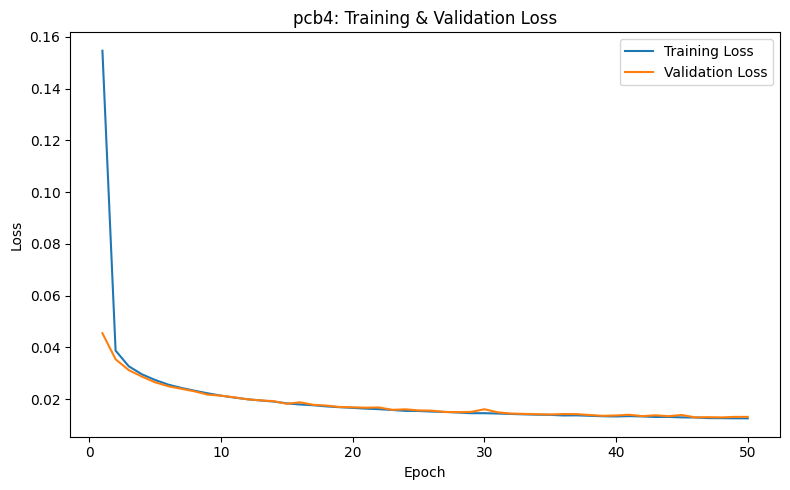

[pipe_fryum] Epoch 1/50  Train Loss: 0.2141  Val Loss: 0.0717


[pipe_fryum] Epoch 5/50  Train Loss: 0.0242  Val Loss: 0.0236


[pipe_fryum] Epoch 10/50  Train Loss: 0.0192  Val Loss: 0.0190


[pipe_fryum] Epoch 15/50  Train Loss: 0.0164  Val Loss: 0.0161


[pipe_fryum] Epoch 20/50  Train Loss: 0.0143  Val Loss: 0.0141


[pipe_fryum] Epoch 25/50  Train Loss: 0.0131  Val Loss: 0.0132


[pipe_fryum] Epoch 30/50  Train Loss: 0.0122  Val Loss: 0.0124


[pipe_fryum] Epoch 35/50  Train Loss: 0.0115  Val Loss: 0.0119


[pipe_fryum] Epoch 40/50  Train Loss: 0.0109  Val Loss: 0.0110


[pipe_fryum] Epoch 45/50  Train Loss: 0.0104  Val Loss: 0.0108


[pipe_fryum] Epoch 50/50  Train Loss: 0.0101  Val Loss: 0.0107
[pipe_fryum] Training done. Best val loss: 0.0105 at epoch 49.
Saved final model to models/VisA\pipe_fryum\pipe_fryum_final.pth and best model to models/VisA\pipe_fryum\pipe_fryum_best.pth


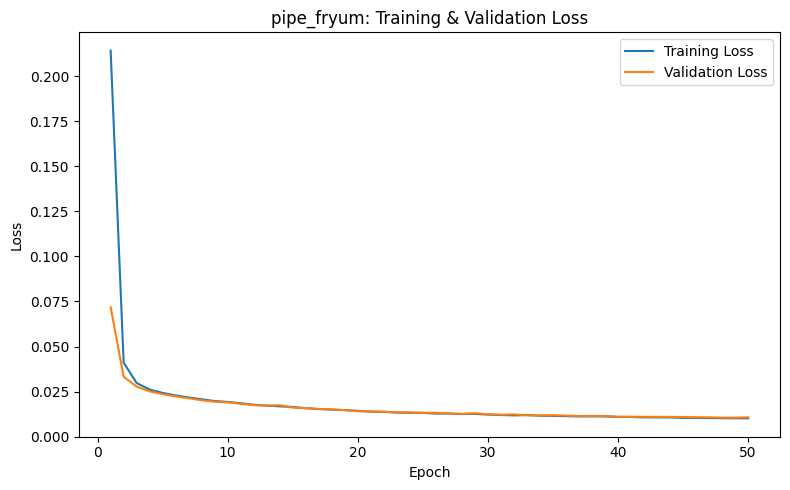

In [22]:
def train_one_category(
    category: str,
    train_loader,
    test_loader,
    backbone,
    in_channels=1536,
    latent_dim=100,
    device=None,
    num_epochs=50,
    lr=1e-3,
    save_root="models/VisA"
):
    """
    Train FeatCAE for one category, saving checkpoints and best model.
    - category: name used for folder/naming
    - backbone: frozen feature extractor
    - save_root: base dir to save models, e.g. 'models'
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    backbone = backbone.to(device)
    backbone.eval()

    # Prepare save directory
    os.makedirs(save_root, exist_ok=True)
    cat_dir = os.path.join(save_root, category)
    os.makedirs(cat_dir, exist_ok=True)

    # Instantiate model
    model = FeatCAE(in_channels=in_channels, latent_dim=latent_dim).to(device)
    criterion = torch.nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_losses = []
    val_losses = []
    best_val = float('inf')
    best_epoch = -1

    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss = 0.0
        total_samples = 0
        pbar = tqdm(train_loader, desc=f"[{category}] Epoch {epoch}/{num_epochs}", leave=False)
        for data, _ in pbar:
            data = data.to(device)
            with torch.no_grad():
                feats = backbone(data)
            recon = model(feats)
            loss = criterion(recon, feats)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            bs = data.size(0)
            running_loss += loss.item() * bs
            total_samples += bs
            pbar.set_postfix({'train_loss': running_loss / total_samples})

        avg_train_loss = running_loss / total_samples
        train_losses.append(avg_train_loss)

        # Validation
        model.eval()
        val_running = 0.0
        val_samples = 0
        with torch.no_grad():
            for data, _ in test_loader:
                data = data.to(device)
                feats = backbone(data)
                recon = model(feats)
                loss = criterion(recon, feats)
                bs = data.size(0)
                val_running += loss.item() * bs
                val_samples += bs
        avg_val_loss = val_running / val_samples if val_samples > 0 else float('nan')
        val_losses.append(avg_val_loss)

        # Logging
        if epoch % 5 == 0 or epoch == 1 or epoch == num_epochs:
            print(f"[{category}] Epoch {epoch}/{num_epochs}  Train Loss: {avg_train_loss:.4f}  Val Loss: {avg_val_loss:.4f}")

        # Check for best
        if avg_val_loss < best_val:
            best_val = avg_val_loss
            best_epoch = epoch
            best_path = os.path.join(cat_dir, f"{category}_best.pth")
            torch.save(model.state_dict(), best_path)

    # After training: save final model
    final_path = os.path.join(cat_dir, f"{category}_final.pth")
    torch.save(model.state_dict(), final_path)
    print(f"[{category}] Training done. Best val loss: {best_val:.4f} at epoch {best_epoch}.")
    print(f"Saved final model to {final_path} and best model to {os.path.join(cat_dir, f'{category}_best.pth')}")

    # Plot losses
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{category}: Training & Validation Loss')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'best_epoch': best_epoch,
        'best_val_loss': best_val,
        'final_model_path': final_path,
        'best_model_path': best_path
    }

# === Usage example ===
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
backbone = resnet_feature_extractor().to(DEVICE)
backbone.eval()
for cat, (train_loader, test_loader) in loaders_dict.items():
    res = train_one_category(
        category=cat,
        train_loader=train_loader,
        test_loader=test_loader,
        backbone=backbone,
        in_channels=1536,
        latent_dim=100,
        device=DEVICE,
        num_epochs=50,
        lr=1e-3,
        save_root="models/VisA"
    )
    # res contains paths and loss curves

### 📥 6. Loading Trained VisA FeatCAE Models

In [23]:
MODEL_ROOT_VisA = "models/VisA"  # base folder where you saved per-category subfolders

def get_categories_from_models(root_dir: str):
    # List subdirectories under root_dir
    return [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d))]

def load_models_per_category(model_root: str, in_channels=1536, latent_dim=100, device=None):
    """
    Loads the saved FeatCAE for each category into a dict.
    Returns: dict {category: model}
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    loaded = {}
    categories = get_categories_from_models(model_root)
    for cat in categories:
        # Try best checkpoint first
        best_path = os.path.join(model_root, cat, f"{cat}_best.pth")
        final_path = os.path.join(model_root, cat, f"{cat}_final.pth")
        if os.path.isfile(best_path):
            model_path = best_path
        elif os.path.isfile(final_path):
            model_path = final_path
        else:
            print(f"[Warning] No saved model for category '{cat}' in {os.path.join(model_root,cat)}; skipping.")
            continue

        # Instantiate model and load weights
        model = FeatCAE(in_channels=in_channels, latent_dim=latent_dim).to(device)
        state = torch.load(model_path, map_location=device)
        # If saved as a checkpoint dict, extract state_dict
        if isinstance(state, dict) and 'model_state_dict' in state:
            model.load_state_dict(state['model_state_dict'])
        else:
            model.load_state_dict(state)
        model.eval()
        loaded[cat] = model
        print(f"Loaded model for category '{cat}' from '{model_path}'")
    return loaded

# Usage:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loaded_models_VisA = load_models_per_category(MODEL_ROOT_VisA, in_channels=1536, latent_dim=100, device=DEVICE)

C:\Users\shaur\AppData\Local\Temp\ipykernel_24844\1162117368.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(model_path, map_location=device)


Loaded model for category 'candle' from 'models/VisA\candle\candle_best.pth'
Loaded model for category 'capsules' from 'models/VisA\capsules\capsules_best.pth'
Loaded model for category 'cashew' from 'models/VisA\cashew\cashew_best.pth'
Loaded model for category 'chewinggum' from 'models/VisA\chewinggum\chewinggum_best.pth'
Loaded model for category 'fryum' from 'models/VisA\fryum\fryum_best.pth'
Loaded model for category 'macaroni1' from 'models/VisA\macaroni1\macaroni1_best.pth'
Loaded model for category 'macaroni2' from 'models/VisA\macaroni2\macaroni2_best.pth'
Loaded model for category 'pcb1' from 'models/VisA\pcb1\pcb1_best.pth'
Loaded model for category 'pcb2' from 'models/VisA\pcb2\pcb2_best.pth'
Loaded model for category 'pcb3' from 'models/VisA\pcb3\pcb3_best.pth'
Loaded model for category 'pcb4' from 'models/VisA\pcb4\pcb4_best.pth'
Loaded model for category 'pipe_fryum' from 'models/VisA\pipe_fryum\pipe_fryum_best.pth'


### 🔍 9. Visualizing Segmentation Error Maps (VisA)


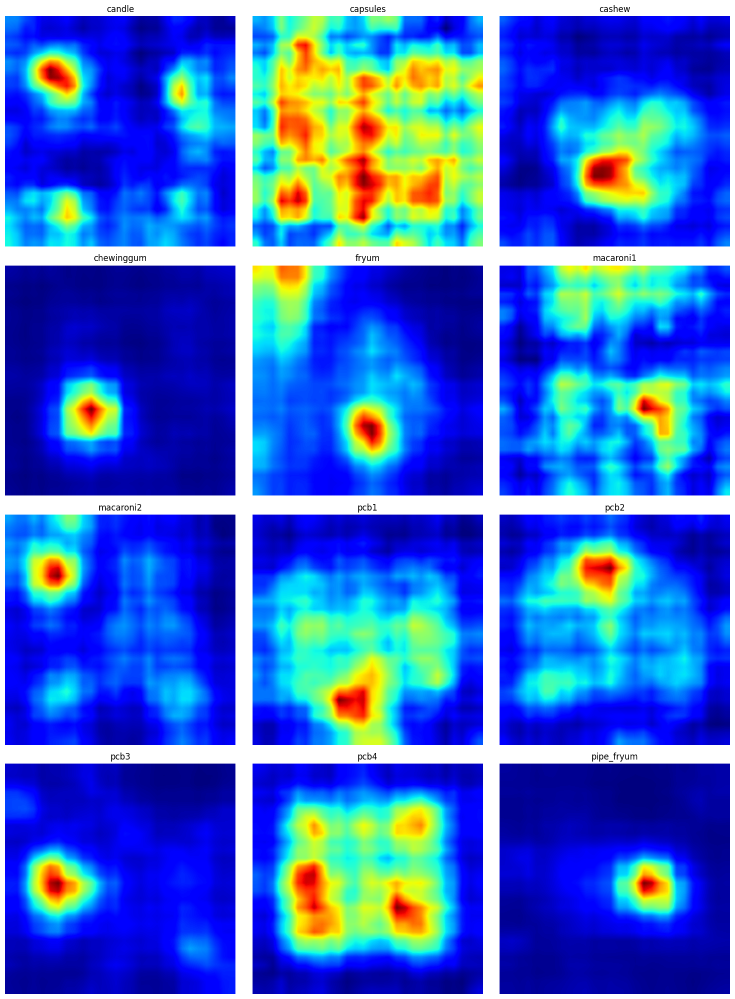

In [26]:
import torch.nn.functional as F
from math import ceil
for cat, model in loaded_models_VisA.items():
    # Locate test folder
    test_dir = os.path.join(DATA_DIR, cat, 'test')
    if not os.path.isdir(test_dir):
        print(f"Skipping {cat}: no test dir")
        continue
    # Find first defect subfolder
    defect_types = [d for d in os.listdir(test_dir)
                    if d.lower() != 'good' and os.path.isdir(os.path.join(test_dir, d))]
    if not defect_types:
        print(f"Skipping {cat}: no defect subfolders")
        continue
    defect = defect_types[0]
    defect_dir = os.path.join(test_dir, defect)
    # List image files
    img_files = sorted([f for f in os.listdir(defect_dir)
                        if f.lower().endswith(('png','jpg','jpeg'))])
    if not img_files:
        print(f"Skipping {cat}: no images in {defect_dir}")
        continue
    img_path = os.path.join(defect_dir, img_files[0])
    # Load and preprocess
    img = Image.open(img_path).convert('RGB')
    inp = transform(img).unsqueeze(0).to(device)  # shape (1,3,224,224)

    # Compute features and reconstruction
    with torch.no_grad():
        feat = backbone(inp)               # (1, C, h, w)
        recon = model(feat)                # (1, C, h, w)
        # Compute per-pixel error: mean over channel dim -> shape (1, h, w)
        err_map = ((feat - recon)**2).mean(dim=1, keepdim=True)  # (1,1,h,w)
        # Upscale to input resolution (224×224) via bilinear
        segm_map = F.interpolate(err_map, size=(224,224), mode='bilinear', align_corners=False)  # (1,1,224,224)

    # Move to CPU for plotting
    segm_np = segm_map[0,0].cpu().numpy()
    items.append({'category': cat, 'segm': segm_np})

# Now plot segmentation maps in a grid, 3 per row
n = len(items)
if n == 0:
    print("No segmentation maps to display.")
else:
    cols = 3
    rows = ceil(n / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axs = axs.flatten()
    for idx, item in enumerate(items):
        ax = axs[idx]
        im = ax.imshow(item['segm'], cmap='jet')
        ax.set_title(item['category'])
        ax.axis('off')
        # Optionally add a colorbar per subplot or a single colorbar:
        # For single colorbar, skip here; add after the loop if desired.
    # Turn off unused axes
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')
    plt.tight_layout()
    plt.show()

### 📊 10. Plotting Reconstruction Error Distributions (VisA)

Collected 200 errors for category 'candle'
Collected 160 errors for category 'capsules'
Collected 150 errors for category 'cashew'
Collected 150 errors for category 'chewinggum'
Collected 150 errors for category 'fryum'
Collected 200 errors for category 'macaroni1'
Collected 200 errors for category 'macaroni2'
Collected 200 errors for category 'pcb1'
Collected 200 errors for category 'pcb2'
Collected 201 errors for category 'pcb3'
Collected 201 errors for category 'pcb4'
Collected 150 errors for category 'pipe_fryum'


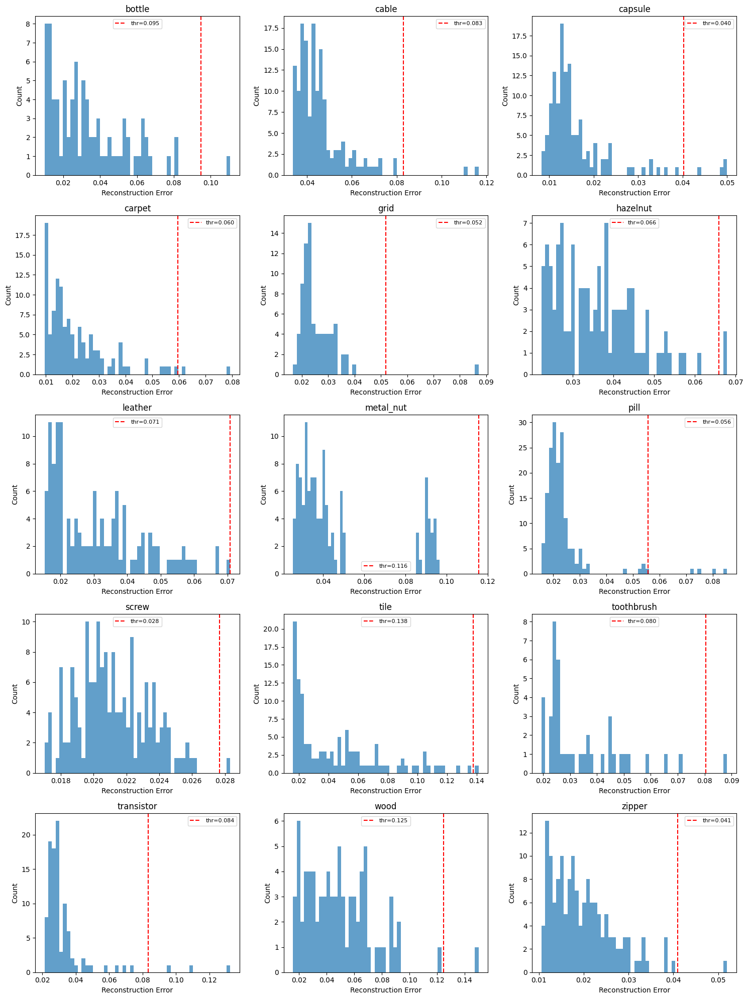

In [28]:
# --- Usage: compute and plot ---
recon_errors_VisA = compute_recon_errors_all(DATA_DIR, backbone, loaded_models_VisA, transform, device)
plot_recon_error_histograms(recon_errors, bins=50)

### 📌 11. Pixel-wise Evaluation on VisA Test Images

candle: collected 200 images, threshold=0.091, positives=100/200
capsules: collected 160 images, threshold=0.108, positives=100/160
cashew: collected 150 images, threshold=0.215, positives=100/150
chewinggum: collected 150 images, threshold=0.336, positives=100/150
fryum: collected 150 images, threshold=0.158, positives=100/150
macaroni1: collected 200 images, threshold=0.063, positives=100/200
macaroni2: collected 200 images, threshold=0.073, positives=100/200
pcb1: collected 200 images, threshold=0.173, positives=100/200
pcb2: collected 200 images, threshold=0.197, positives=100/200
pcb3: collected 201 images, threshold=0.189, positives=100/201
pcb4: collected 201 images, threshold=0.115, positives=100/201
pipe_fryum: collected 150 images, threshold=0.314, positives=100/150


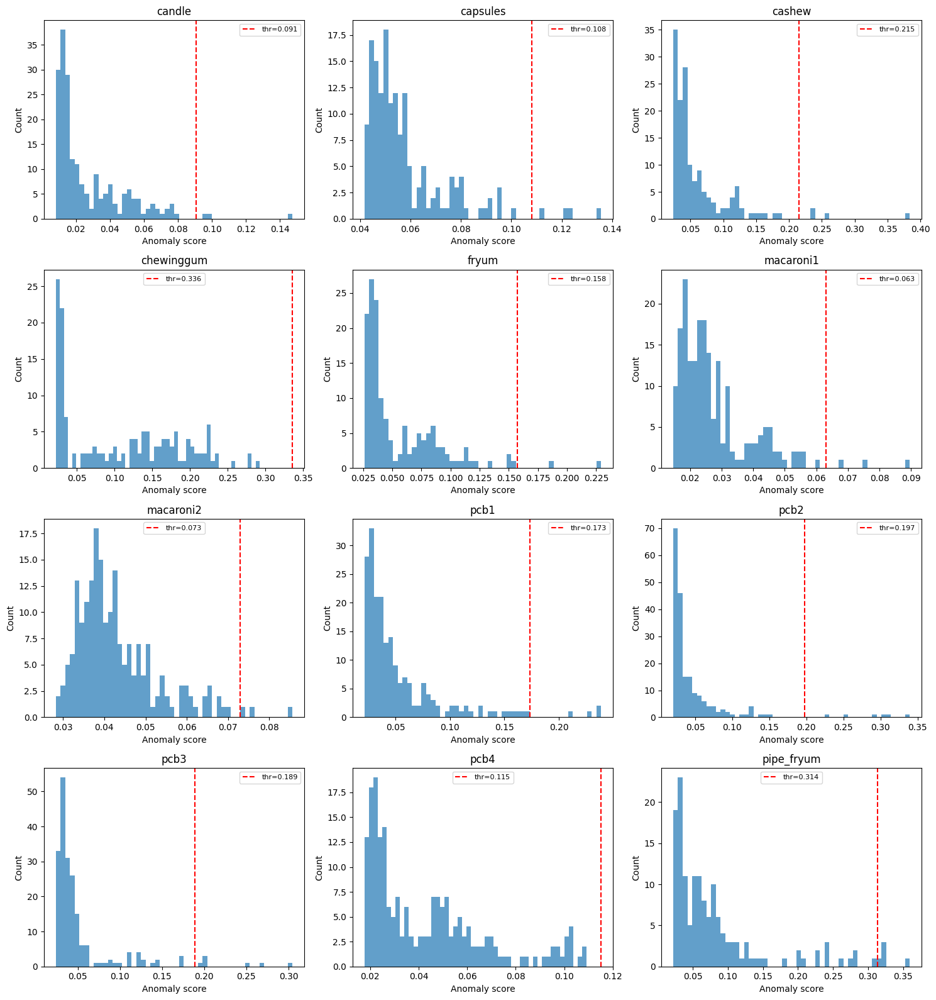

In [36]:
# Ensure backbone and loaded_models are in eval mode on device:
backbone.eval()
for m in loaded_models_VisA.values():
    m.eval()

results_VisA = {}  # to store y_true, y_score, y_pred, threshold per category

for cat, model in loaded_models_VisA.items():
    test_dir = Path(DATA_DIR) / cat / 'test'
    if not test_dir.exists():
        print(f"Skipping {cat}: no test dir")
        continue

    y_true_VisA = []
    y_score_VisA = []
    # Loop over all images under test/<subfolder>/*.png (or jpg)
    for img_path in test_dir.glob('*/*.JPG'):
        fault_type = img_path.parent.name  # folder name, e.g. 'good' or defect type
        # Load and preprocess
        img = Image.open(img_path).convert('RGB')
        inp = transform(img).unsqueeze(0).to(device)  # shape (1,3,224,224)
        with torch.no_grad():
            feat = backbone(inp)   # (1, C, h, w)
            recon = model(feat)    # (1, C, h, w)
        # Compute segmentation map: mean squared error over channels
        segm_map = ((feat - recon)**2).mean(dim=1)  # shape (1, h, w)
        # Optional crop borders if desired:
        _, H, W = segm_map.shape
        if H > 6 and W > 6:
            segm_map = segm_map[:, 3:-3, 3:-3]  # shape (1, h-6, w-6)
        # Compute anomaly score via decision_function: expects shape (N, H, W)
        score_tensor = decision_function(segm_map)  # shape (1,)
        score = score_tensor.item()
        y_score_VisA.append(score)
        y_true_VisA.append(0 if fault_type.lower() == 'good' else 1)

    if len(y_score_VisA) == 0:
        print(f"No test images found for {cat}")
        continue

    y_score_VisA = np.array(y_score_VisA, dtype=np.float32)
    y_true_VisA = np.array(y_true_VisA, dtype=int)
    mean = y_score_VisA.mean()
    std = y_score_VisA.std()
    threshold_VisA = mean + 3 * std
    y_pred_VisA = (y_score_VisA >= threshold_VisA).astype(int)

    results_VisA[cat] = {
        'y_true': y_true_VisA,
        'y_score': y_score_VisA,
        'y_pred': y_pred_VisA,
        'threshold': threshold_VisA
    }
    print(f"{cat}: collected {len(y_score_VisA)} images, threshold={threshold_VisA:.3f}, positives={y_true_VisA.sum()}/{len(y_true_VisA)}")

# Now plot histograms of y_score with threshold line, 3 per row
categories = list(results_VisA.keys())
n = len(categories)
if n == 0:
    print("No categories to plot.")
else:
    cols = 3
    rows = ceil(n / cols)
    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    axs = axs.flatten()
    for idx, cat in enumerate(categories):
        data = results_VisA[cat]
        errors = data['y_score']
        thr = data['threshold']

        ax = axs[idx]
        ax.hist(errors, bins=50, alpha=0.7)
        ax.axvline(thr, color='r', linestyle='--', label=f"thr={thr:.3f}")
        ax.set_title(cat)
        ax.set_xlabel("Anomaly score")
        ax.set_ylabel("Count")
        ax.legend(fontsize=8)

    # Turn off unused subplots
    for j in range(idx + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

### 📈 12. Per-Category Evaluation: ROC & Confusion Matrix

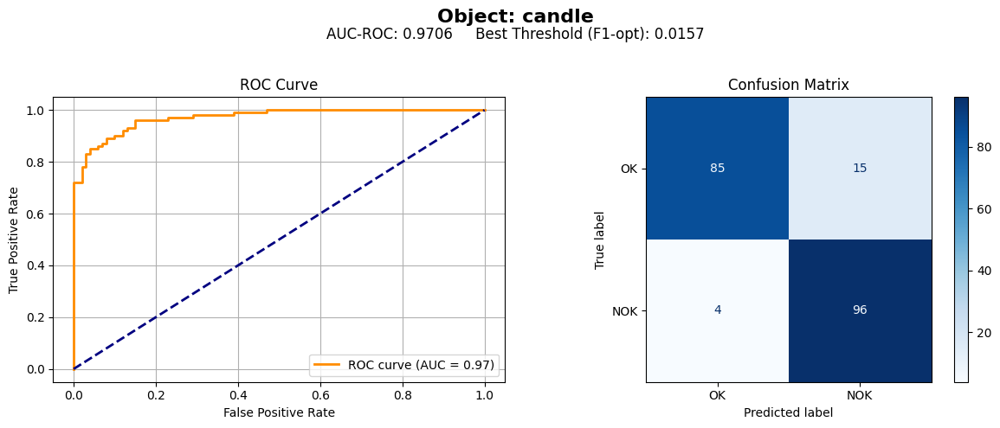

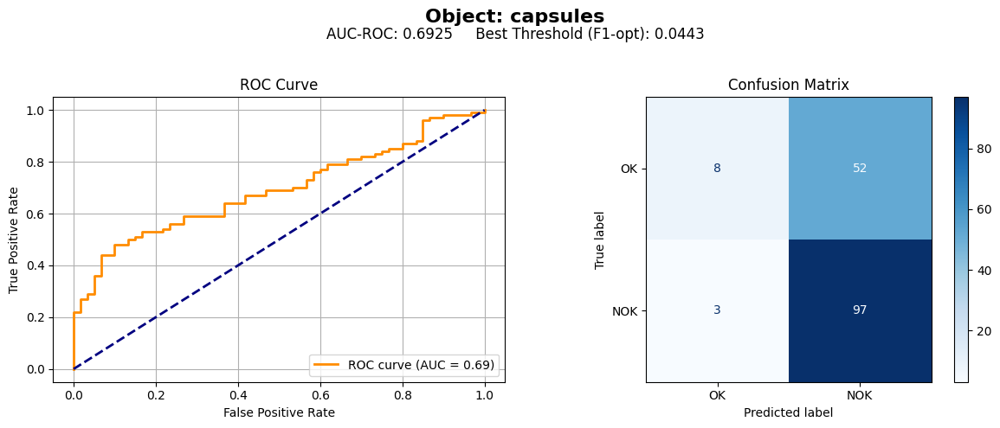

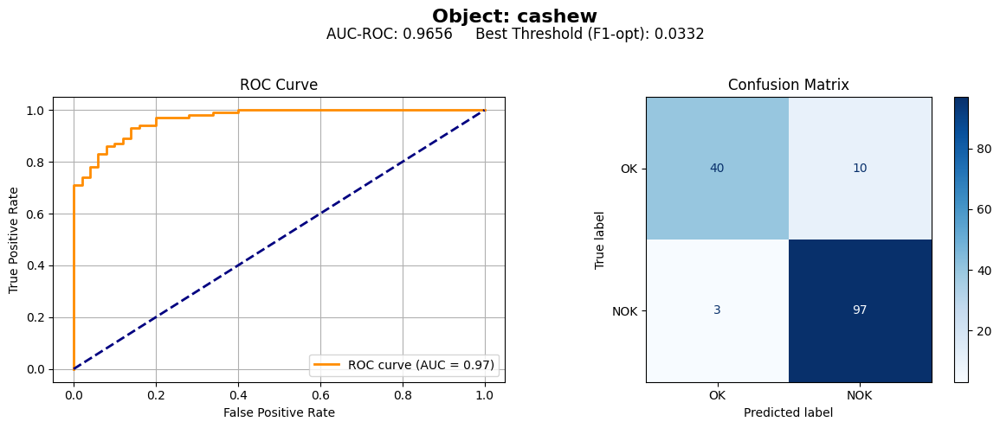

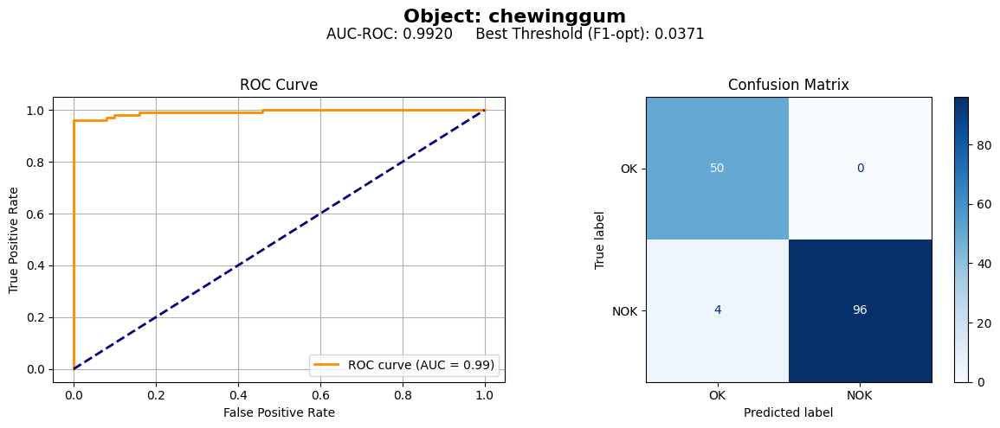

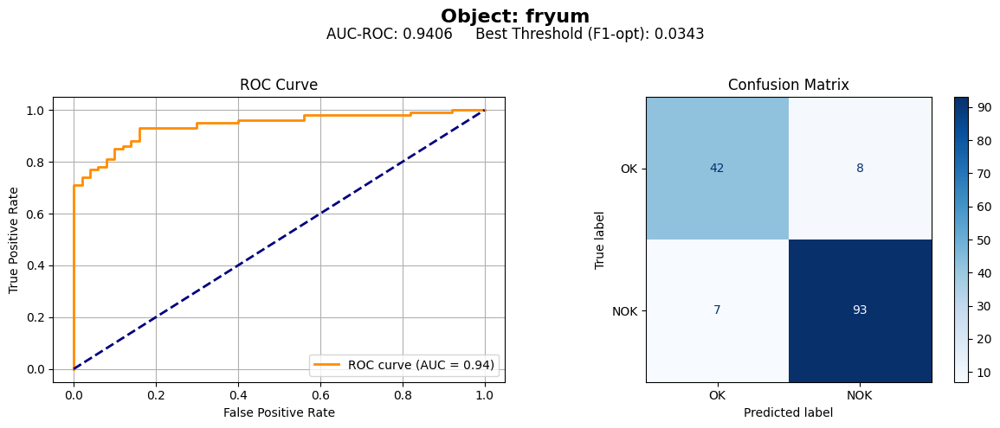

...

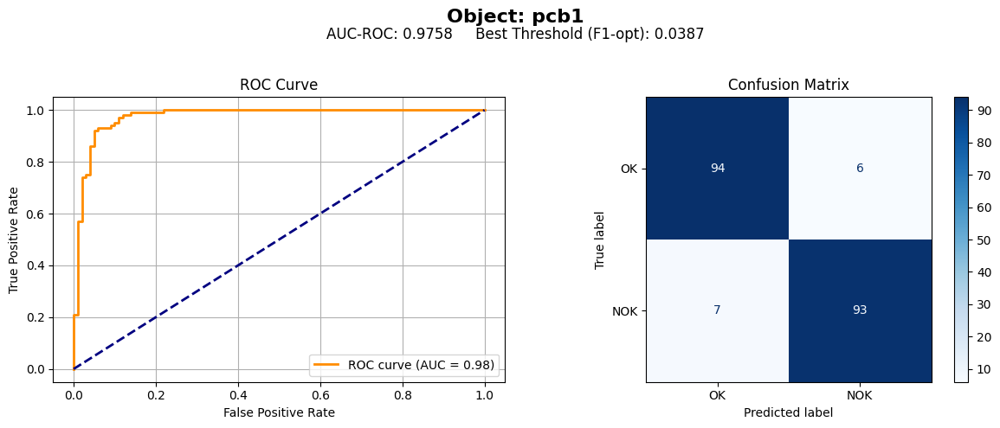

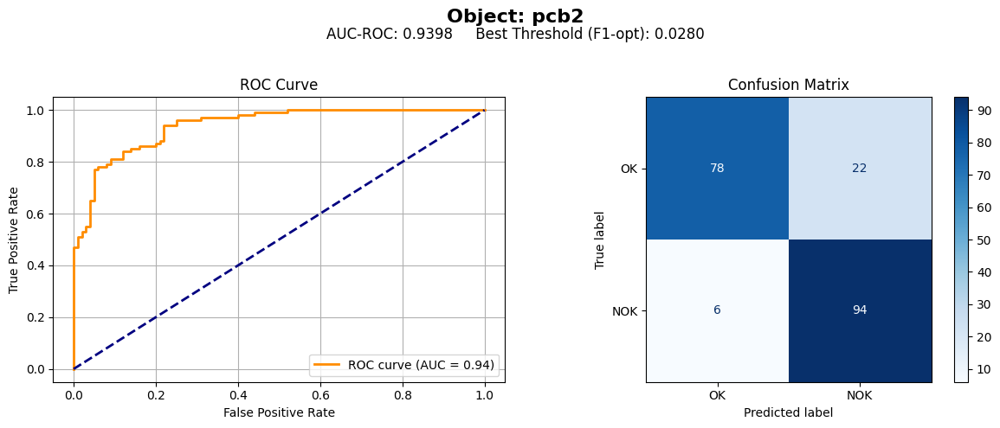

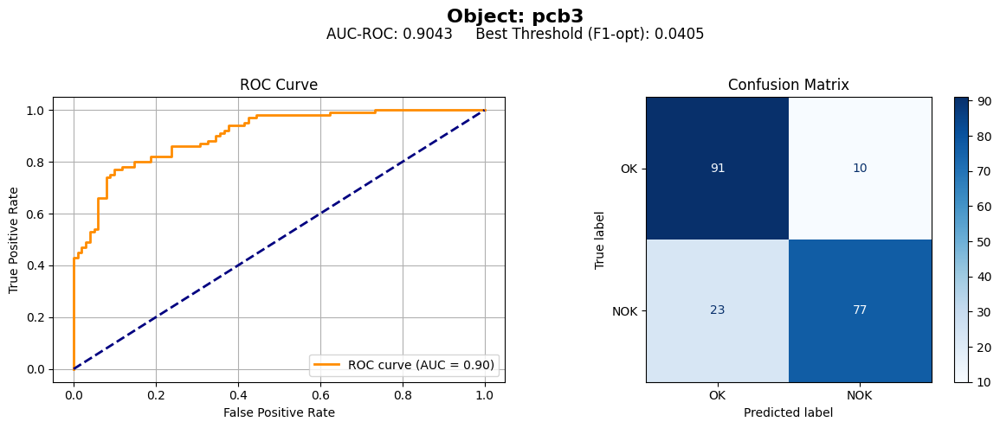

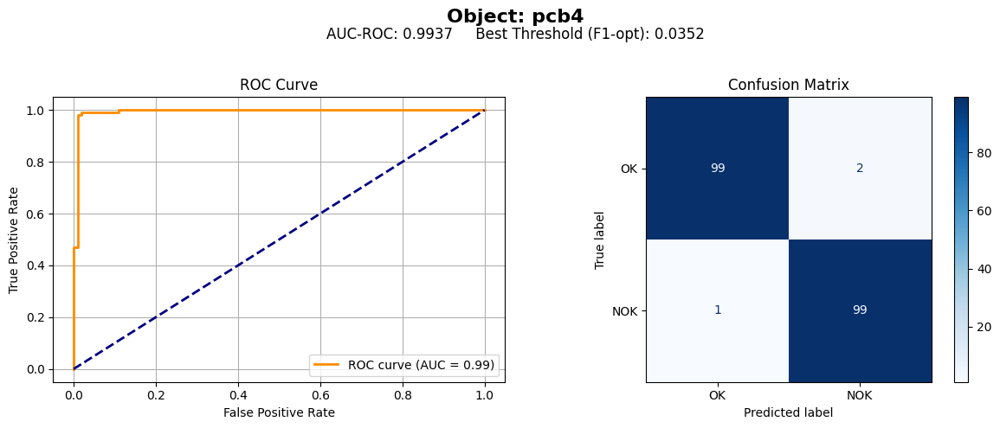

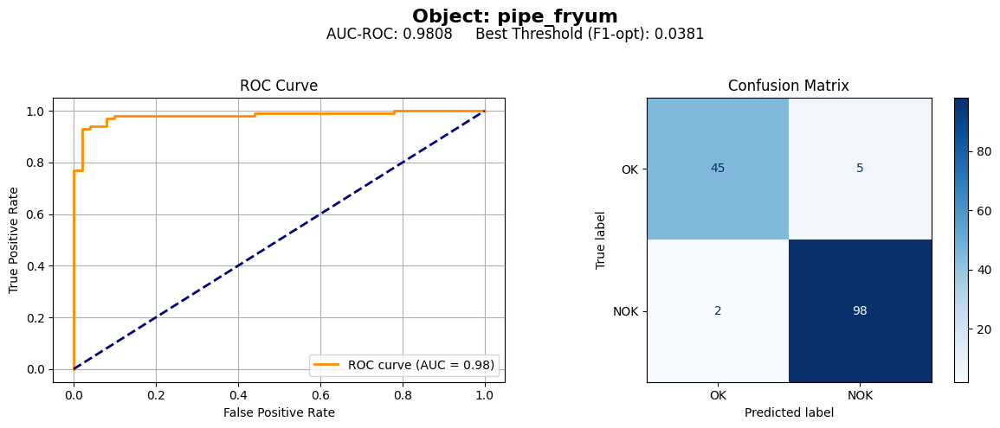

In [37]:
for cat, data in results_VisA.items():
    y_true = data['y_true']
    y_score = data['y_score']
    
    if np.unique(y_true).size < 2:
        print(f"\nObject: {cat}\n[Warning] Only one class in ground truth. Skipping AUC and CM.\n")
        continue

    # --- Metrics ---
    auc_roc = roc_auc_score(y_true, y_score)
    fpr, tpr, thresholds = roc_curve(y_true, y_score)
    f1_scores = [f1_score(y_true, y_score >= thr) for thr in thresholds]
    best_threshold = thresholds[np.argmax(f1_scores)]
    y_pred = (y_score >= best_threshold).astype(int)
    cm = confusion_matrix(y_true, y_pred)

    # --- Layout ---
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"Object: {cat}", fontsize=16, fontweight='bold')

    # Metrics above plots
    plt.figtext(0.5, 0.91,
                f"AUC-ROC: {auc_roc:.4f}     Best Threshold (F1-opt): {best_threshold:.4f}",
                ha='center', fontsize=12)

    # --- ROC Curve ---
    axs[0].plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc_roc:.2f})')
    axs[0].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].set_title('ROC Curve')
    axs[0].legend(loc="lower right")
    axs[0].grid(True)

    # --- Confusion Matrix ---
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['OK', 'NOK'])
    disp.plot(ax=axs[1], cmap='Blues', values_format='d')
    axs[1].set_title("Confusion Matrix")

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

### 📊 13. AUROC Summary Table & Visualization


📊 AUROC Scores Per Object
-----------------------------------
    Object  AUC-ROC
    candle   0.9706
  capsules   0.6925
    cashew   0.9656
chewinggum   0.9920
     fryum   0.9406
 macaroni1   0.9212
 macaroni2   0.7360
      pcb1   0.9758
      pcb2   0.9398
      pcb3   0.9043
      pcb4   0.9937
pipe_fryum   0.9808
-----------------------------------


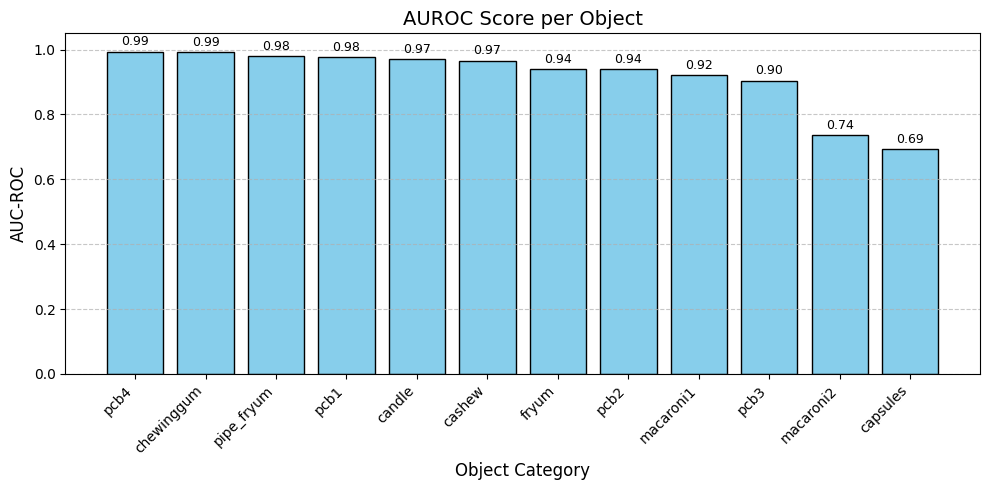

In [43]:
import pandas as pd

# Step 1: Collect AUROC scores
auroc_table_VisA = []
for cat, data in results_VisA.items():
    y_true = data['y_true']
    y_score = data['y_score']
    
    if np.unique(y_true).size < 2:
        auroc_table_VisA.append({'Object': cat, 'AUC-ROC': None})
    else:
        auc_roc = roc_auc_score(y_true, y_score)
        auroc_table_VisA.append({'Object': cat, 'AUC-ROC': round(auc_roc, 4)})

# Step 2: Create a DataFrame
df_auroc_VisA = pd.DataFrame(auroc_table_VisA)

# Step 3: Display as a nice table
print("\n📊 AUROC Scores Per Object\n" + "-" * 35)
print(df_auroc_VisA.fillna("N/A (One class only)").to_string(index=False))
print("-" * 35)

# Step 4: Bar plot of valid AUROC scores
plot_df = df_auroc_VisA.dropna(subset=["AUC-ROC"]).sort_values(by="AUC-ROC", ascending=False)

plt.figure(figsize=(10, 5))
bars = plt.bar(plot_df["Object"], plot_df["AUC-ROC"], color='skyblue', edgecolor='black')
plt.title("AUROC Score per Object", fontsize=14)
plt.ylabel("AUC-ROC", fontsize=12)
plt.xlabel("Object Category", fontsize=12)
plt.ylim(0, 1.05)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45, ha='right')

# Add labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.01, f"{height:.2f}", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


### 📄 14. AUROC Summary: MVTec vs VisA

In [47]:
# --- MVTec AUROC ---
mvtec_rows = []
for cat, res in results.items():
    auroc = roc_auc_score(res['y_true'], res['y_score'])
    mvtec_rows.append({'Category': cat, 'AUROC': auroc})
df_mvtec = pd.DataFrame(mvtec_rows).sort_values('Category')
mean_mvtec = df_mvtec['AUROC'].mean()
df_mvtec.loc['Mean'] = ['Mean', mean_mvtec]

# --- VisA AUROC ---
visa_rows = []
for cat, res in results_VisA.items():
    auroc = roc_auc_score(res['y_true'], res['y_score'])
    visa_rows.append({'Category': cat, 'AUROC': auroc})
df_visa = pd.DataFrame(visa_rows).sort_values('Category')
mean_visa = df_visa['AUROC'].mean()
df_visa.loc['Mean'] = ['Mean', mean_visa]

# --- Display tables ---
print("\nMVTec AUROC:")
print(df_mvtec.to_string(index=False, float_format="%.3f"))

print("\nVisA AUROC:")
print(df_visa.to_string(index=False, float_format="%.3f"))



MVTec AUROC:
  Category  AUROC
    bottle  1.000
     cable  0.987
   capsule  0.942
    carpet  0.986
      grid  0.974
  hazelnut  1.000
   leather  1.000
 metal_nut  0.996
      pill  0.943
     screw  0.860
      tile  0.996
toothbrush  0.953
transistor  0.974
      wood  0.989
    zipper  0.982
      Mean  0.972

VisA AUROC:
  Category  AUROC
    candle  0.971
  capsules  0.693
    cashew  0.966
chewinggum  0.992
     fryum  0.941
 macaroni1  0.921
 macaroni2  0.736
      pcb1  0.976
      pcb2  0.940
      pcb3  0.904
      pcb4  0.994
pipe_fryum  0.981
      Mean  0.918


In [48]:
# # --- Save to CSV ---
# os.makedirs("results", exist_ok=True)
# df_mvtec.to_csv("results/mvtec_auroc.csv", index=False, float_format="%.5f")
# df_visa.to_csv("results/visa_auroc.csv", index=False, float_format="%.5f")
# print("\nSaved AUROC tables to: results/mvtec_auroc.csv and results/visa_auroc.csv")


Saved AUROC tables to: results/mvtec_auroc.csv and results/visa_auroc.csv


### 📄 15. Per-Category Metrics Report

This section provides **detailed evaluation metrics** for each category in both **MVTec** and **VisA** datasets.

In [55]:
from sklearn.metrics import (
    roc_auc_score, roc_curve,
    precision_score, recall_score, f1_score,
    confusion_matrix, balanced_accuracy_score
)

# Ensure the results folder exists
os.makedirs("results", exist_ok=True)

def compute_metrics_table(results_dict, dataset_name="Dataset"):
    """
    Given a dict mapping category -> {'y_true':..., 'y_score':...},
    compute metrics using F1-optimal threshold per category, returning a DataFrame.
    Metrics: AUROC, BestThr, Precision, Recall, F1, Specificity, BalancedAcc, Error%.
    """
    rows = []
    for cat, data in results_dict.items():
        y_true = data['y_true']
        y_score = data['y_score']
        # Skip if only one class present
        if np.unique(y_true).size < 2:
            print(f"Skipping {dataset_name} category '{cat}': only one class in ground truth.")
            continue

        # 1) AUROC
        try:
            auc = roc_auc_score(y_true, y_score)
        except ValueError:
            print(f"Could not compute AUROC for {dataset_name}/{cat}, skipping.")
            continue

        # 2) Find F1-optimal threshold via ROC curve
        fpr, tpr, thresholds = roc_curve(y_true, y_score)
        f1s = []
        for thr in thresholds:
            y_pred_thr = (y_score >= thr).astype(int)
            f1s.append(f1_score(y_true, y_pred_thr, zero_division=0))
        f1s = np.array(f1s)
        best_idx = np.nanargmax(f1s)
        best_thr = thresholds[best_idx]
        y_pred = (y_score >= best_thr).astype(int)

        # 3) Precision, Recall, F1 at best threshold
        prec = precision_score(y_true, y_pred, zero_division=0)
        rec = recall_score(y_true, y_pred, zero_division=0)
        f1 = f1s[best_idx]

        # 4) Confusion matrix: TN, FP, FN, TP
        cm = confusion_matrix(y_true, y_pred)
        if cm.shape == (2,2):
            tn, fp, fn, tp = cm.ravel()
        else:
            # Unexpected shape, but since we skip single-class, should not happen
            tn = fp = fn = tp = 0
        specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan
        bal_acc = balanced_accuracy_score(y_true, y_pred)

        # 5) Error %
        err_pct = (y_pred != y_true).mean() * 100

        rows.append({
            'Category': cat,
            'AUROC': auc,
            'BestThr': best_thr,
            'Precision': prec,
            'Recall': rec,
            'F1': f1,
            'Specificity': specificity,
            'BalancedAcc': bal_acc,
            'Error%': err_pct
        })

    # Build DataFrame
    df = pd.DataFrame(rows)
    if df.empty:
        print(f"No valid categories to compute metrics for {dataset_name}.")
        return df

    df = df.sort_values('Category').reset_index(drop=True)
    # Append mean row (skip averaging BestThr)
    mean_vals = {
        'Category': 'Mean',
        'AUROC': df['AUROC'].mean(),
        'BestThr': np.nan,
        'Precision': df['Precision'].mean(),
        'Recall': df['Recall'].mean(),
        'F1': df['F1'].mean(),
        'Specificity': df['Specificity'].mean(),
        'BalancedAcc': df['BalancedAcc'].mean(),
        'Error%': df['Error%'].mean()
    }
    df.loc[len(df)] = mean_vals
    return df

# Compute for MVTec
df_mvtec = compute_metrics_table(results, dataset_name="MVTec")
# Compute for VisA
df_visa = compute_metrics_table(results_VisA, dataset_name="VisA")

# Print nicely with formatting
def print_metrics_df(df, title):
    if df.empty:
        print(f"\n{title}: No data to display.\n")
        return
    print(f"\n{title}:")
    print(df.to_string(index=False, formatters={
        'AUROC': lambda x: f"{x:.3f}" if pd.notna(x) else "",
        'BestThr': lambda x: f"{x:.4f}" if pd.notna(x) else "",
        'Precision': lambda x: f"{x:.3f}" if pd.notna(x) else "",
        'Recall': lambda x: f"{x:.3f}" if pd.notna(x) else "",
        'F1': lambda x: f"{x:.3f}" if pd.notna(x) else "",
        'Specificity': lambda x: f"{x:.3f}" if pd.notna(x) else "",
        'BalancedAcc': lambda x: f"{x:.3f}" if pd.notna(x) else "",
        'Error%': lambda x: f"{x:.2f}%" if pd.notna(x) else ""
    }))

print_metrics_df(df_mvtec, "MVTec Metrics per Category")
print_metrics_df(df_visa, "VisA Metrics per Category")

C:\Users\shaur\AppData\Local\Temp\ipykernel_24844\138729379.py:92: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[len(df)] = mean_vals



MVTec Metrics per Category:
  Category AUROC BestThr Precision Recall    F1 Specificity BalancedAcc Error%
    bottle 1.000  0.0697     1.000  1.000 1.000       1.000       1.000  0.00%
     cable 0.987  0.0830     0.967  0.957 0.962       0.948       0.952  4.67%
   capsule 0.942  0.0289     0.907  0.982 0.943       0.522       0.752  9.85%
    carpet 0.986  0.0221     0.977  0.966 0.972       0.929       0.947  4.27%
      grid 0.974  0.0442     1.000  0.947 0.973       1.000       0.974  3.85%
  hazelnut 1.000  0.1150     1.000  1.000 1.000       1.000       1.000  0.00%
   leather 1.000  0.0491     1.000  1.000 1.000       1.000       1.000  0.00%
 metal_nut 0.996  0.0773     1.000  0.978 0.989       1.000       0.989  1.74%
      pill 0.943  0.0476     0.951  0.965 0.958       0.731       0.848  7.19%
     screw 0.860  0.0442     0.797  0.992 0.884       0.268       0.630 19.38%
      tile 0.996  0.0498     1.000  0.976 0.988       1.000       0.988  1.71%
toothbrush 0.953  0.077

C:\Users\shaur\AppData\Local\Temp\ipykernel_24844\138729379.py:92: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[len(df)] = mean_vals


In [56]:
# # Save to CSV under results/
# mvtec_csv = os.path.join("results", "mvtec_metrics.csv")
# visa_csv = os.path.join("results", "visa_metrics.csv")
# df_mvtec.to_csv(mvtec_csv, index=False, float_format="%.5f")
# df_visa.to_csv(visa_csv, index=False, float_format="%.5f")
# print(f"\nSaved MVTec metrics to: {mvtec_csv}")
# print(f"Saved VisA metrics to:   {visa_csv}")


Saved MVTec metrics to: results\mvtec_metrics.csv
Saved VisA metrics to:   results\visa_metrics.csv
